# 1.Importing libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from pandas_profiling import ProfileReport
import seaborn as sns
from scipy import stats
import pylab
from sklearn.preprocessing import normalize
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

# 2. Reading dataset

In [2]:
df = pd.read_csv(r"C:\Users\Hp\Desktop\revision\ML\Projects\Rain-Prediction-main (1)\Rain-Prediction-main\weatherAUS.csv")


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# 3.EDA

In [4]:
pp = ProfileReport(df)
pp

Summarize dataset:   0%|          | 0/36 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Observation
 Variable types
* Categorical = 5
* Numeric = 16
* Boolean = 2

### Categorical data
* Date
-> High cardinality
-> No missing values

* Location
-> Distinct = 49
-> No missing values

* WindGustDir
-> Distinct = 16
-> Missing = 10326
-> Missing (%) = 7.1%

* WindDir9am
-> Distinct = 16
-> Missing = 10566
-> Missing (%) = 7.3%

* WindDir3pm
-> Distinct = 16
-> Missing = 4228
-> Missing (%) = 2.9%

### Numerical data
* MinTemp
-> Missing = 1485
-> Missing (%) = 1.0%
-> MinTemp is highly correlated with Temp9am

* MaxTemp
-> Missing = 1261
-> Missing (%) = 0.9%
-> MaxTemp is highly correlated with Temp3pm

* Rainfall
-> Missing = 3261
-> Missing (%) = 2.2%

* Evaporation
-> Missing = 62790
-> Missing (%) = 43.2%

* Sunshine
-> Missing = 69835
-> Missing (%) = 48.0%
-> Zeros = 2359
-> Zeros (%) = 1.6%

* WindGustSpeed
-> Missing = 10263
-> Missing (%) = 7.1%

* WindSpeed9am
-> Missing = 1767
-> Missing (%) = 1.2%

* WindSpeed3pm
-> Missing = 3062
-> Missing (%) = 2.1%

* Humidity3pm
-> Missing = 4507
-> Missing (%) = 3.1%

* Humidity9am
-> Missing = 2654
-> Missing (%) = 1.8%

* Pressure9am
-> Missing = 15065
-> Missing (%) = 10.4%
-> Pressure9am is highly correlated with Pressure3pm	

* Pressure3pm
-> Missing = 15028
-> Missing (%) = 10.3%
-> Pressure3pm is highly correlated with Pressure9am

* Cloud9am
-> Missing = 55888
-> Missing (%) = 38.4%

* Cloud3pm
-> Missing = 59358
-> Missing (%) = 40.8

* Temp9am
-> Missing = 1767
-> Missing (%) = 1.2%
-> Temp9am is highly correlated with MinTemp	

* Temp3pm
->Missing = 3609
->Missing (%) = 2.5%
->Temp3pm is highly correlated with MaxTemp

### Boolean

* RainToday
-> Missing = 3261
-> Missing (%) = 2.2%

* RainTomorrow
-> Missing = 3267
-> Missing (%) = 2.2%


### classifing into numerical, discrete, continous for better evaluation

In [5]:
numerical = [feature for feature in df.columns if df[feature].dtypes != 'O']
discrete = [feature for feature in numerical if len(df[feature].unique())<25]
continous = [feature for feature in numerical if feature not in discrete]
categorical = [feature for feature in df.columns if feature not in numerical]

print('count_numerical : ',len(numerical))
print('count_discrete : ',len(discrete))
print('count_continous : ',len(continous))
print('count_categorical : ',len(categorical))

count_numerical :  16
count_discrete :  2
count_continous :  14
count_categorical :  7


### Dealing with missing data

In [6]:
# For discrete data

def mode_nan(df,variable):
    mode = df[variable].value_counts().index[0]
    df[variable].fillna(mode,inplace=True)
    
mode_nan(df,"Cloud9am")
mode_nan(df,"Cloud3pm")

-> sucessfully replaced nan values with mode

In [7]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [8]:
# for continous data
def interpolate1 (df,variable):
    interpolate = df[variable].mean()
    df[variable].fillna(interpolate,inplace=True)
    


In [9]:
for i in continous:
    interpolate1(df,i)

In [10]:
df.isnull().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation          0
Sunshine             0
WindGustDir      10326
WindGustSpeed        0
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am          0
Pressure3pm          0
Cloud9am             0
Cloud3pm             0
Temp9am              0
Temp3pm              0
RainToday         3261
RainTomorrow      3267
dtype: int64

In [11]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,5.468232,7.611178,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,5.468232,7.611178,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,5.468232,7.611178,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,5.468232,7.611178,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,5.468232,7.611178,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


### Encoding categorical variable

In [12]:
df.RainToday = pd.get_dummies(df.RainToday,drop_first=True)
df.RainTomorrow = pd.get_dummies(df.RainTomorrow,drop_first=True)

In [13]:
df.isna().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation          0
Sunshine             0
WindGustDir      10326
WindGustSpeed        0
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am          0
Pressure3pm          0
Cloud9am             0
Cloud3pm             0
Temp9am              0
Temp3pm              0
RainToday            0
RainTomorrow         0
dtype: int64

In [14]:
for feature in categorical:
    print(feature, (df.groupby([feature])['RainTomorrow'].mean().sort_values(ascending=False)).index)

Date Index(['2007-11-01', '2008-01-19', '2007-12-07', '2007-12-15', '2007-12-16',
       '2007-12-19', '2007-12-20', '2007-12-21', '2007-12-22', '2007-12-24',
       ...
       '2008-05-02', '2008-05-01', '2008-04-30', '2008-04-29', '2008-04-28',
       '2008-04-26', '2008-04-25', '2016-11-26', '2012-04-07', '2008-08-17'],
      dtype='object', name='Date', length=3436)
Location Index(['Portland', 'Walpole', 'Cairns', 'Dartmoor', 'NorfolkIsland',
       'MountGambier', 'Albany', 'Witchcliffe', 'CoffsHarbour', 'MountGinini',
       'NorahHead', 'Darwin', 'Sydney', 'SydneyAirport', 'Ballarat',
       'GoldCoast', 'Watsonia', 'Newcastle', 'Hobart', 'Wollongong',
       'Williamtown', 'Launceston', 'Brisbane', 'MelbourneAirport', 'Adelaide',
       'Sale', 'Albury', 'Perth', 'Melbourne', 'Nuriootpa', 'Penrith',
       'BadgerysCreek', 'PerthAirport', 'Tuggeranong', 'Richmond', 'Bendigo',
       'Canberra', 'WaggaWagga', 'Townsville', 'Katherine', 'PearceRAAF',
       'SalmonGums', 'Nhil', 

In [15]:
df.select_dtypes(exclude='number').columns

Index(['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm'], dtype='object')

In [16]:
windGustDir={'NNW':0, 'NW':1, 'WNW':2, 'N':3, 'W':4, 'WSW':5, 'NNE':6, 'S':7, 'SSW':8, 'SW':9, 'SSE':10,
       'NE':11, 'SE':12, 'ESE':13, 'ENE':14, 'E':15}

windDir9am ={'NNW':0, 'N':1, 'NW':2, 'NNE':3, 'WNW':4, 'W':5, 'WSW':6, 'SW':7, 'SSW':8, 'NE':9, 'S':10,
       'SSE':11, 'ENE':12, 'SE':13, 'ESE':14, 'E':15}

windDir3pm = {'NW':0, 'NNW':1, 'N':2, 'WNW':3, 'W':4, 'NNE':5, 'WSW':6, 'SSW':7, 'S':8, 'SW':9, 'SE':10,
       'NE':11, 'SSE':12, 'ENE':13, 'E':14, 'ESE':15}


df.WindGustDir = df.WindGustDir.map(windGustDir)
df.WindDir9am = df.WindDir9am.map(windDir9am)
df.WindDir3pm = df.WindDir3pm.map(windDir3pm)

-> sucessfully converted from categorical to numerical

In [17]:
# converting location
df1 = df.groupby(['Location'])['RainTomorrow'].value_counts().sort_values(ascending=False).unstack()

In [18]:
# for classifyng on the basic of their will be rain tomorrow
df1[1].sort_values(ascending=False).index

Index(['Portland', 'Cairns', 'Walpole', 'Dartmoor', 'MountGambier',
       'NorfolkIsland', 'Albany', 'Witchcliffe', 'CoffsHarbour', 'Sydney',
       'Darwin', 'MountGinini', 'NorahHead', 'Ballarat', 'GoldCoast',
       'SydneyAirport', 'Hobart', 'Watsonia', 'Newcastle', 'Wollongong',
       'Brisbane', 'Williamtown', 'Launceston', 'Adelaide', 'MelbourneAirport',
       'Perth', 'Sale', 'Melbourne', 'Canberra', 'Albury', 'Penrith',
       'Nuriootpa', 'BadgerysCreek', 'Tuggeranong', 'PerthAirport', 'Bendigo',
       'Richmond', 'WaggaWagga', 'Townsville', 'PearceRAAF', 'SalmonGums',
       'Moree', 'Cobar', 'Mildura', 'Katherine', 'AliceSprings', 'Nhil',
       'Woomera', 'Uluru'],
      dtype='object', name='Location')

In [19]:
location ={'Portland':0, 'Cairns':1, 'Walpole':2, 'Dartmoor':3, 'MountGambier':4,
       'NorfolkIsland':5, 'Albany':6, 'Witchcliffe':7, 'CoffsHarbour':8, 'Sydney':9,
       'Darwin':10, 'MountGinini':11, 'NorahHead':12, 'Ballarat':13, 'GoldCoast':14,
       'SydneyAirport':15, 'Hobart':16, 'Watsonia':17, 'Newcastle':18, 'Wollongong':19,
       'Brisbane':20, 'Williamtown':21, 'Launceston':22, 'Adelaide':23, 'MelbourneAirport':24,
       'Perth':25, 'Sale':26, 'Melbourne':27, 'Canberra':28, 'Albury':29, 'Penrith':30,
       'Nuriootpa':31, 'BadgerysCreek':32, 'Tuggeranong':33, 'PerthAirport':34, 'Bendigo':35,
       'Richmond':36, 'WaggaWagga':37, 'Townsville':38, 'PearceRAAF':39, 'SalmonGums':40,
       'Moree':41, 'Cobar':42, 'Mildura':43, 'Katherine':44, 'AliceSprings':45, 'Nhil':46,
       'Woomera':47, 'Uluru':49
    
}

df.Location = df.Location.map(location)

In [20]:
df.select_dtypes(exclude='number').columns

Index(['Date'], dtype='object')

-> sucessfully converted categorical into numerical

In [21]:
df.isna().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation          0
Sunshine             0
WindGustDir      10326
WindGustSpeed        0
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am          0
Pressure3pm          0
Cloud9am             0
Cloud3pm             0
Temp9am              0
Temp3pm              0
RainToday            0
RainTomorrow         0
dtype: int64

In [22]:
df["WindGustDir"] =df["WindGustDir"].fillna(df["WindGustDir"].mode().index[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].mode().index[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].mode().index[0])

In [23]:
df.isna().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

-> sucessfully removed nan values

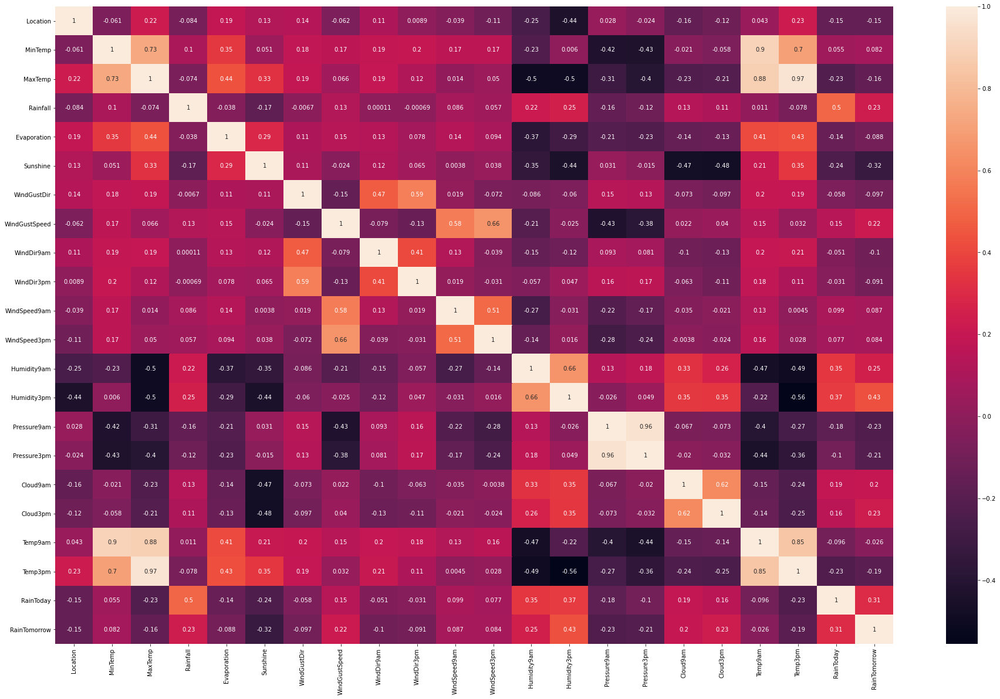

In [24]:
plt.rcParams['figure.figsize'] = 32,20
corr = df.corr()
sns.heatmap(corr,annot=True)

# 4. FEATURE_Engineering

### Finding corelation btw independent feature and removing highly corelated data

In [25]:
corr = df.corr()
drop_col = set()

for i in range(len(corr.columns)):
    for j in range (i):
        if abs(corr.iloc[i,j]>0.8):
            col = corr.columns[i]
            drop_col.add(col)

In [26]:
drop_col

{'Pressure3pm', 'Temp3pm', 'Temp9am'}

-> since it is important it is not removing

### finding independent variable which is low corelated to output

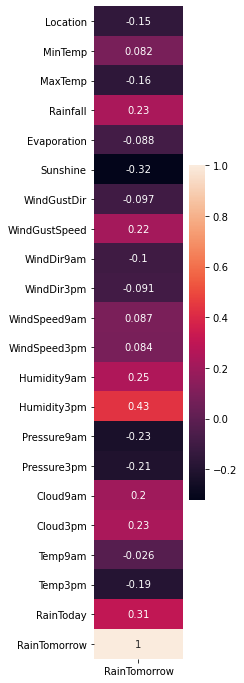

In [27]:

plt.rcParams["figure.figsize"] = 2,12 
sns.heatmap(corr.iloc[:,-1:],annot=True)

In [28]:
drop_col =set()
for i in enumerate(corr["RainTomorrow"]):
    if abs(i[1]) < 0.1:
        column = corr.columns[i[0]]
        drop_col.add(column)

In [29]:
drop_col

{'Evaporation',
 'MinTemp',
 'Temp9am',
 'WindDir3pm',
 'WindGustDir',
 'WindSpeed3pm',
 'WindSpeed9am'}

In [30]:
# removing data column
df.drop(columns=['Date'],inplace=True)

# 5. Data normalisation

In [31]:
plt.rcParams['figure.figsize'] = 10,5

def plotfig(df,feature):
    
    print('skewness : ',stats.skew(df[feature]))
    print('kurtosis : ',stats.kurtosis(df[feature]))
    plt.subplot(1,2,1)
    sns.distplot(df[feature])
    plt.subplot(1,2,2)
    stats.probplot(df[feature],plot=pylab)
    plt.show()

skewness :  0.03194026574955863
kurtosis :  -1.1563126076041723


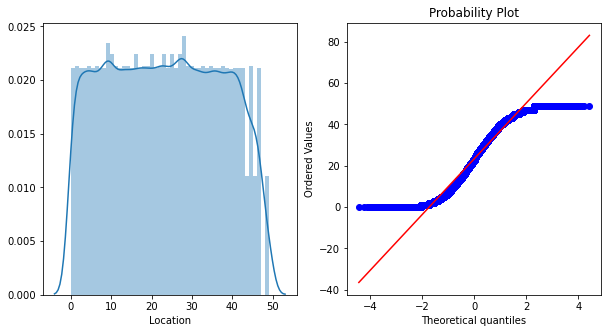

skewness :  0.02129705286590445
kurtosis :  -0.45804619681583336


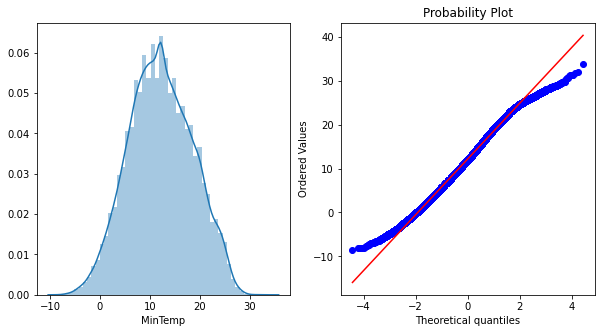

skewness :  0.22180054357022308
kurtosis :  -0.2003936779073161


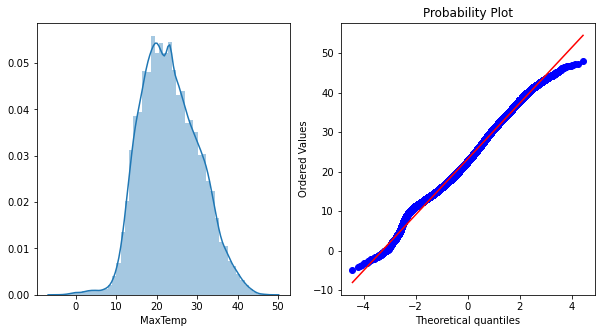

skewness :  9.948266360684524
kurtosis :  182.2999251868465


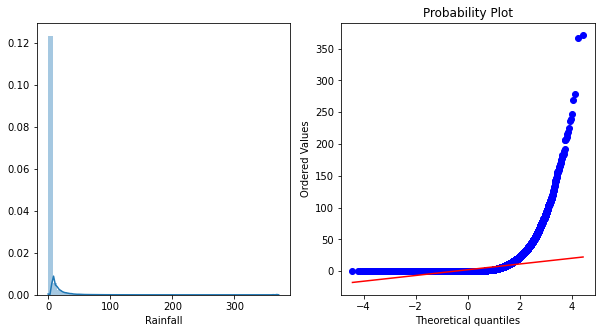

skewness :  4.989147014680598
kurtosis :  81.52844708552


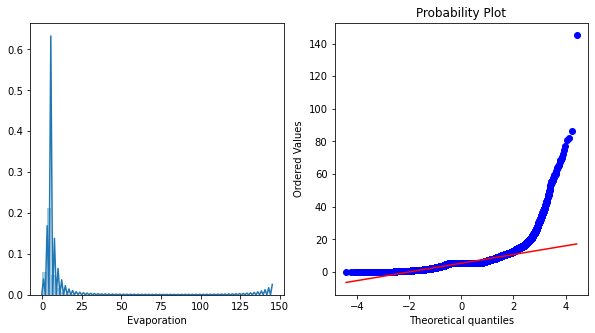

skewness :  -0.6885449147356643
kurtosis :  1.1748533001395494


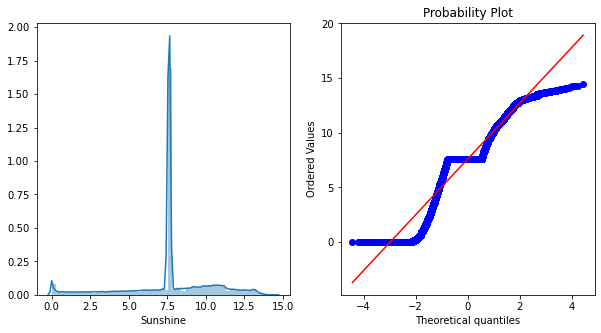

skewness :  0.07605912792544076
kurtosis :  -1.2395331254055169


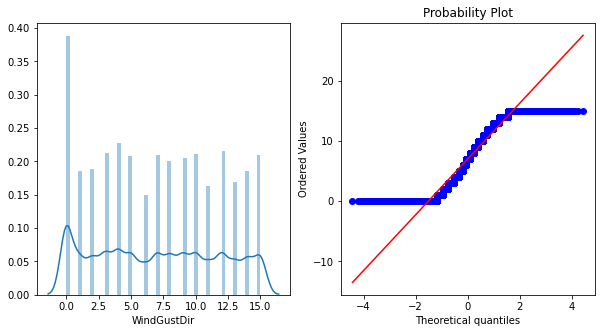

skewness :  0.9074681208733025
kurtosis :  1.7539636593411183


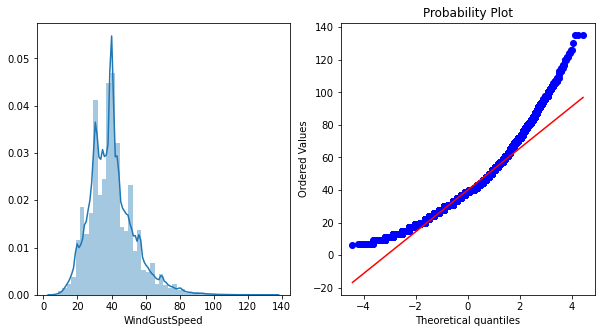

skewness :  0.08854177136425183
kurtosis :  -1.3229977874834673


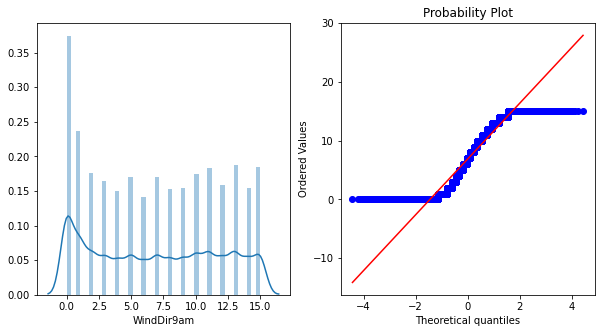

skewness :  -0.002828127692261494
kurtosis :  -1.1987530027489277


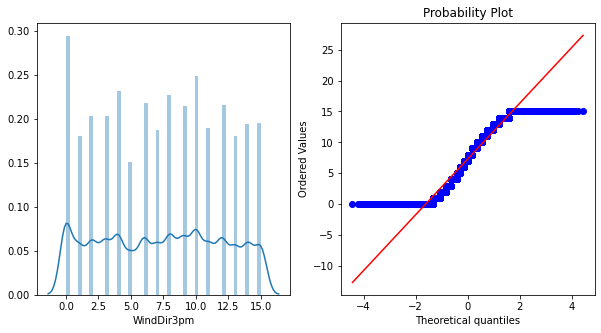

skewness :  0.7823880101615263
kurtosis :  1.2788849365875699


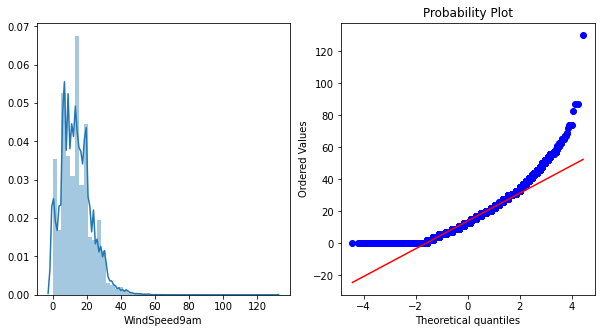

skewness :  0.6349270996763587
kurtosis :  0.8447224610558823


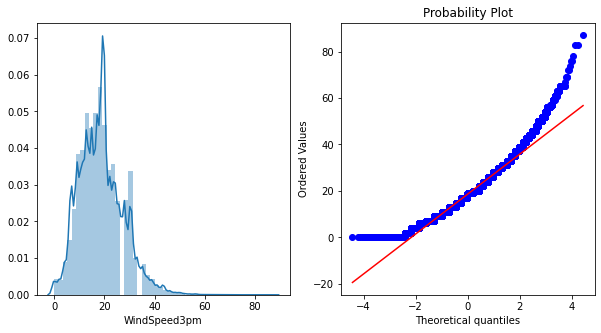

skewness :  -0.48844035927414353
kurtosis :  0.017459514412653476


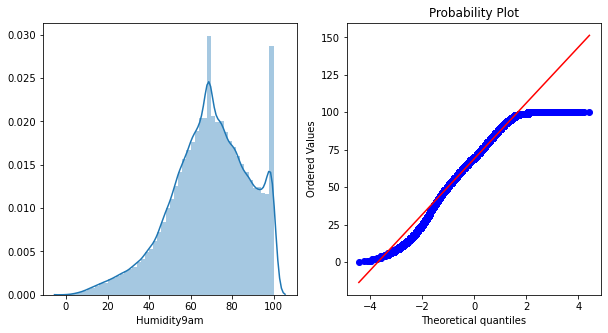

skewness :  0.03414718863598944
kurtosis :  -0.43181380582782847


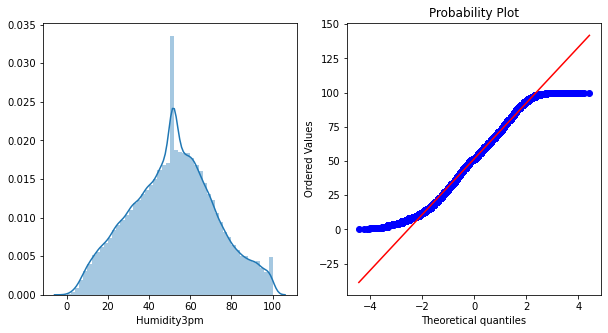

skewness :  -0.10088977988393301
kurtosis :  0.6048553565480161


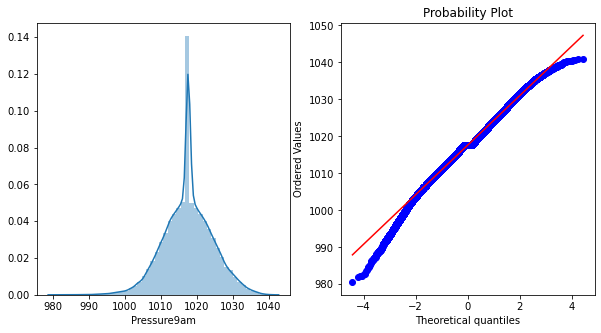

skewness :  -0.04817740175552025
kurtosis :  0.48964888366247816


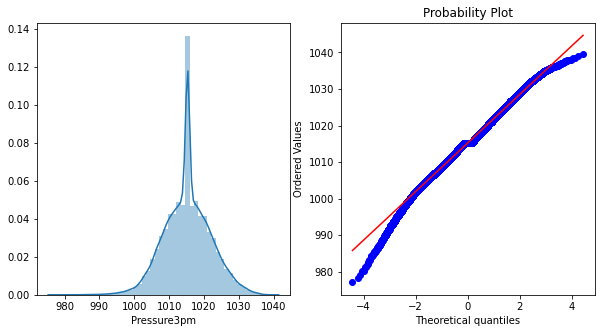

skewness :  -1.0198469448812126
kurtosis :  -0.5672970581242276


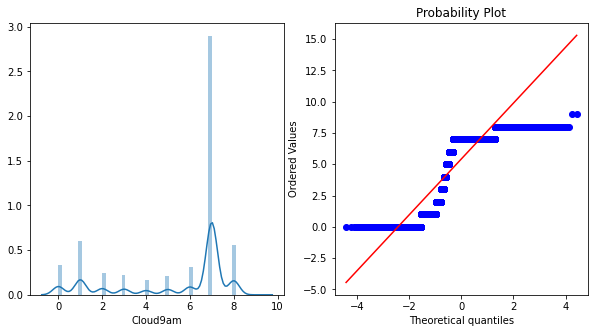

skewness :  -1.0781418449542741
kurtosis :  -0.37522115161712044


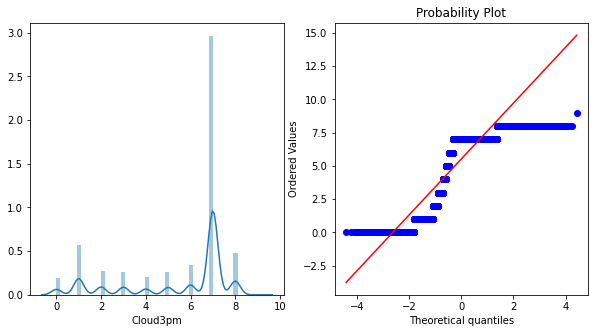

skewness :  0.08908179365843011
kurtosis :  -0.3078498937943417


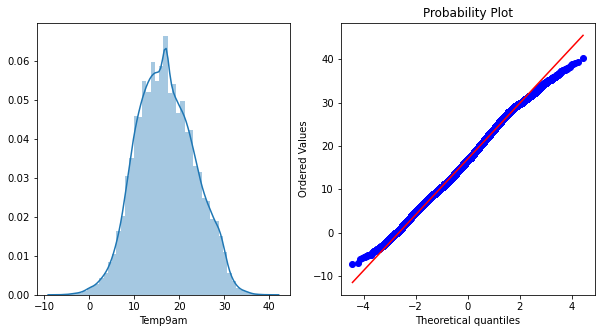

skewness :  0.24096591917631102
kurtosis :  -0.06346064931547213


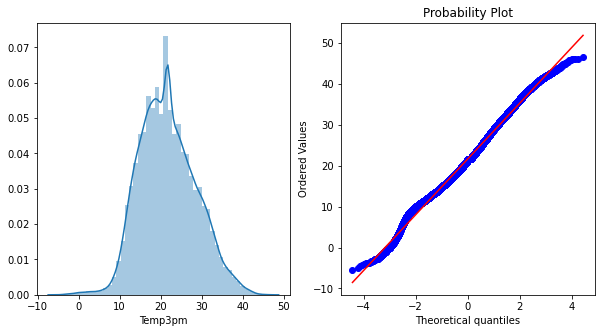

skewness :  1.3577254789135824
kurtosis :  -0.15658152390888347


C:\Users\Hp\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


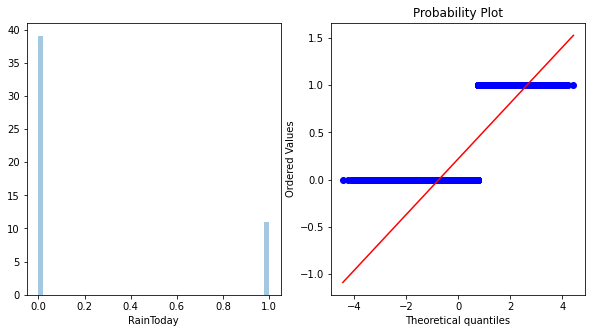

skewness :  1.3578711489433986
kurtosis :  -0.15618594286713483


C:\Users\Hp\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


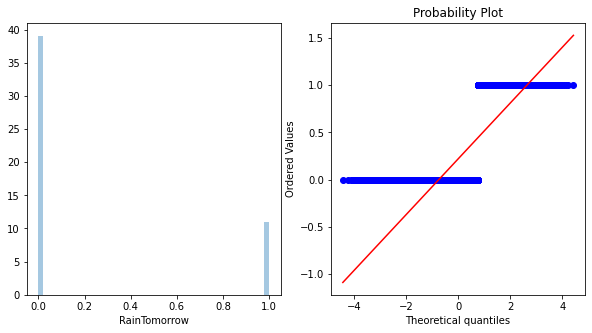

In [32]:
for i in df.columns:
    plotfig(df,i)

## Normalisation

skewness(-1,1) and kurtosis (-2,2)
-> normalisation required on

1.Rainfall

2.Evaporation

3.Raintoday

4RainTomorrow


# 6. OUTLIER DETECTION

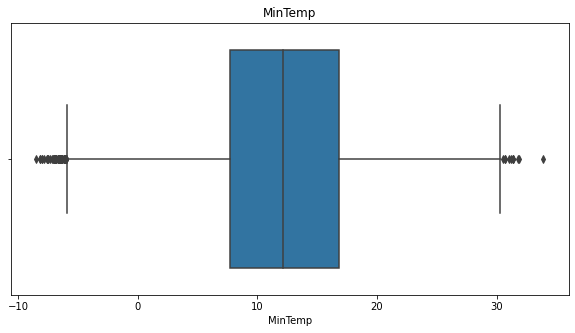

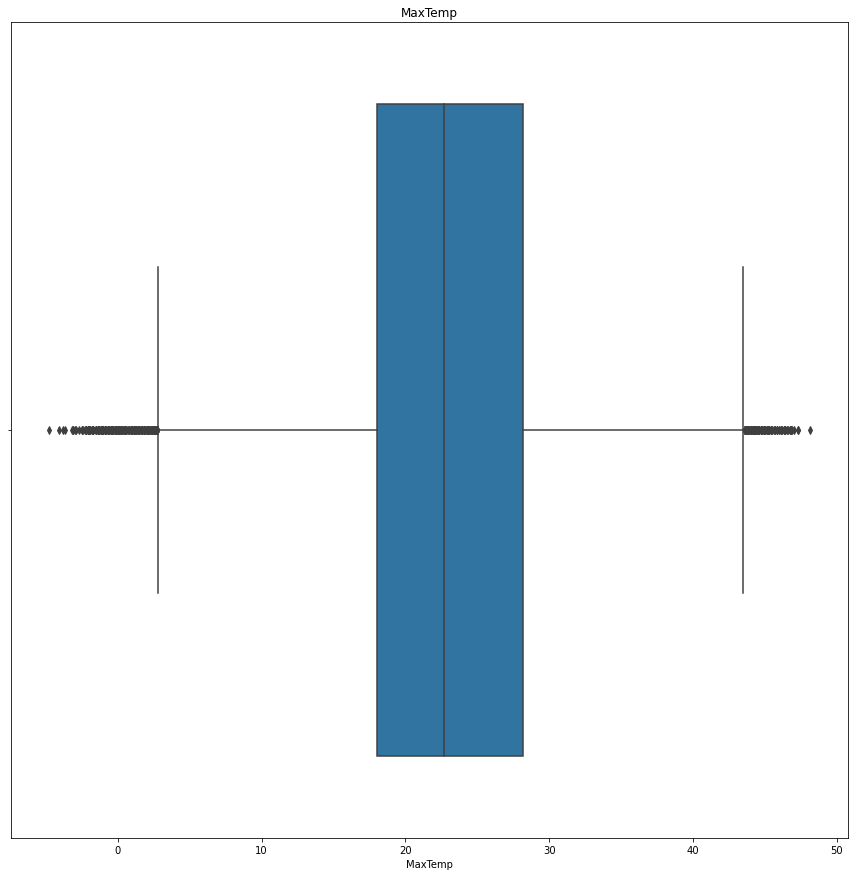

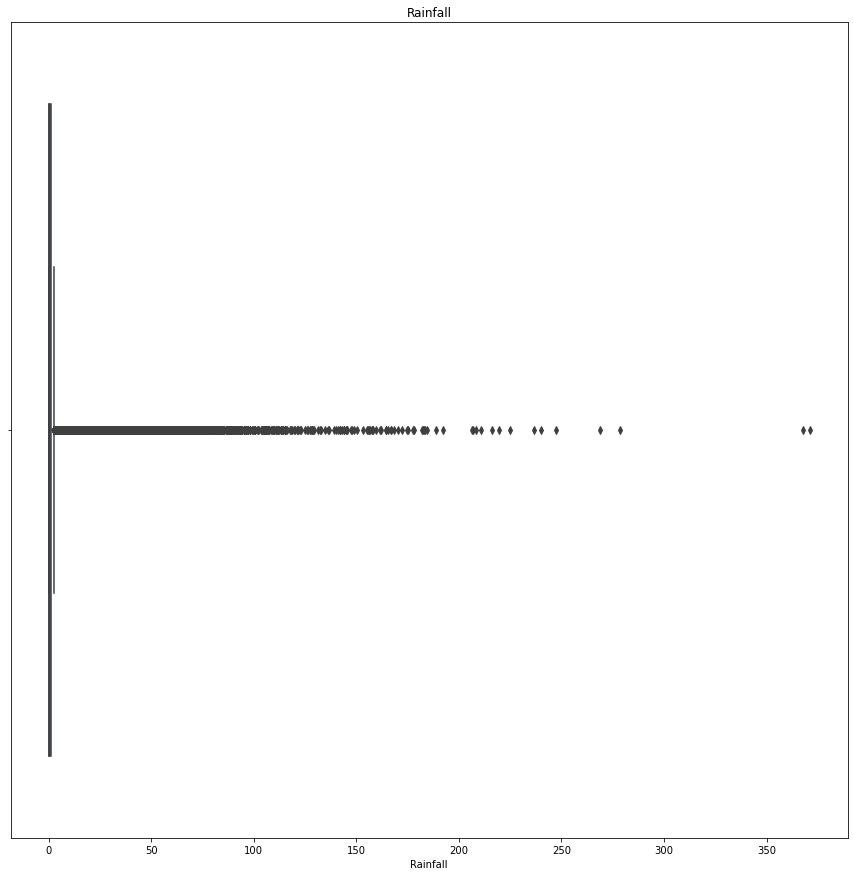

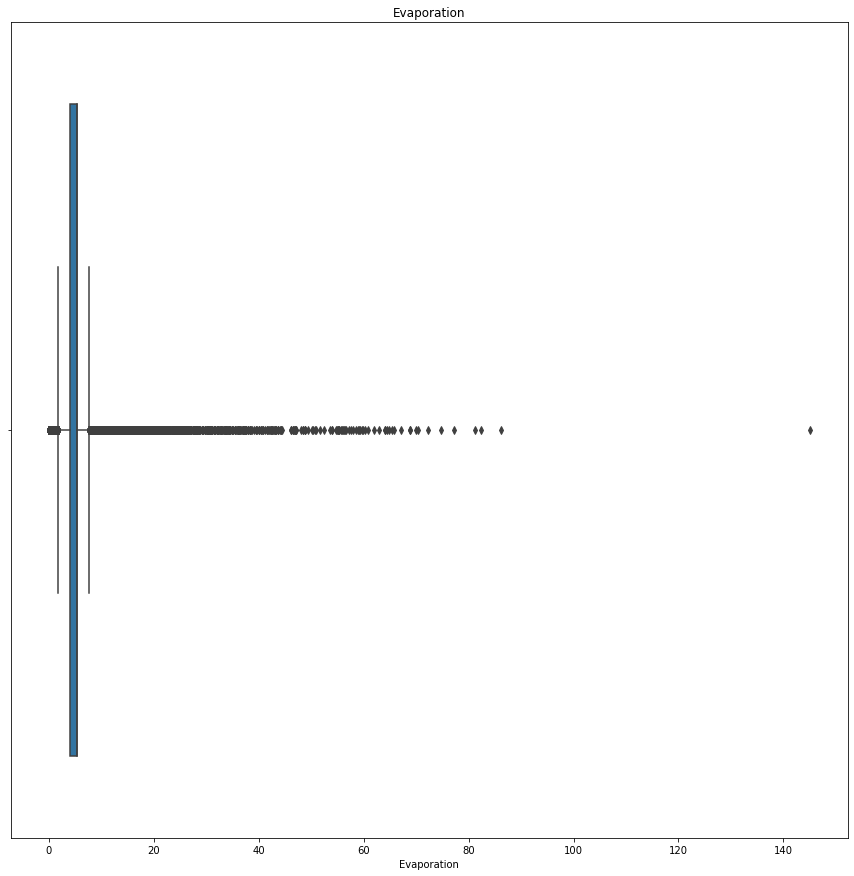

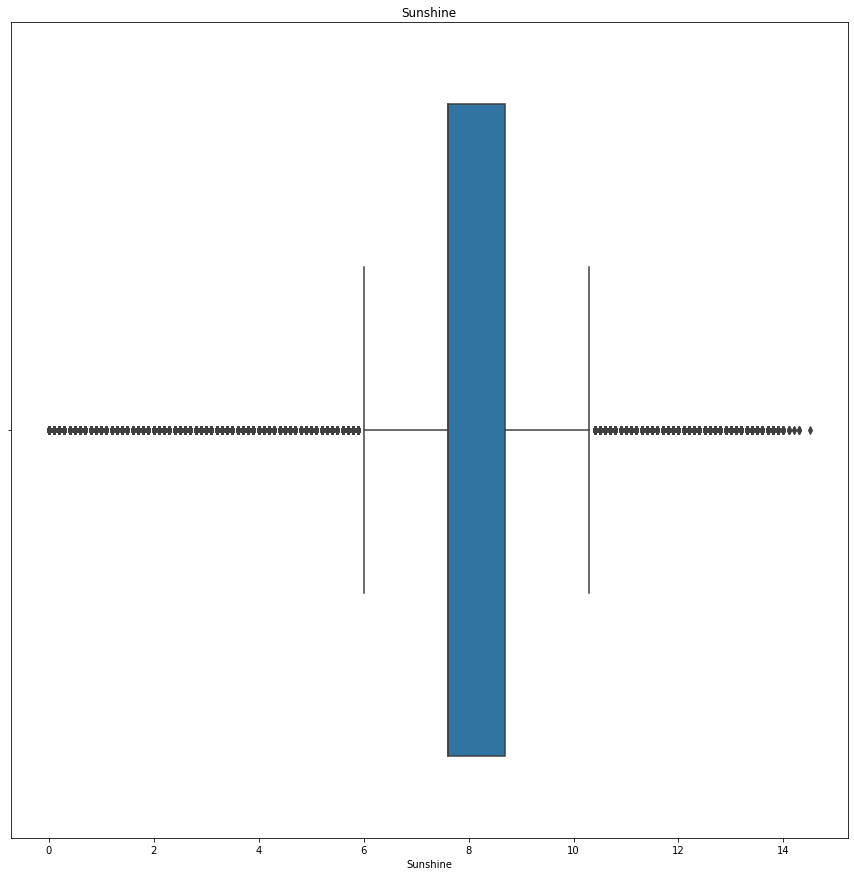

...

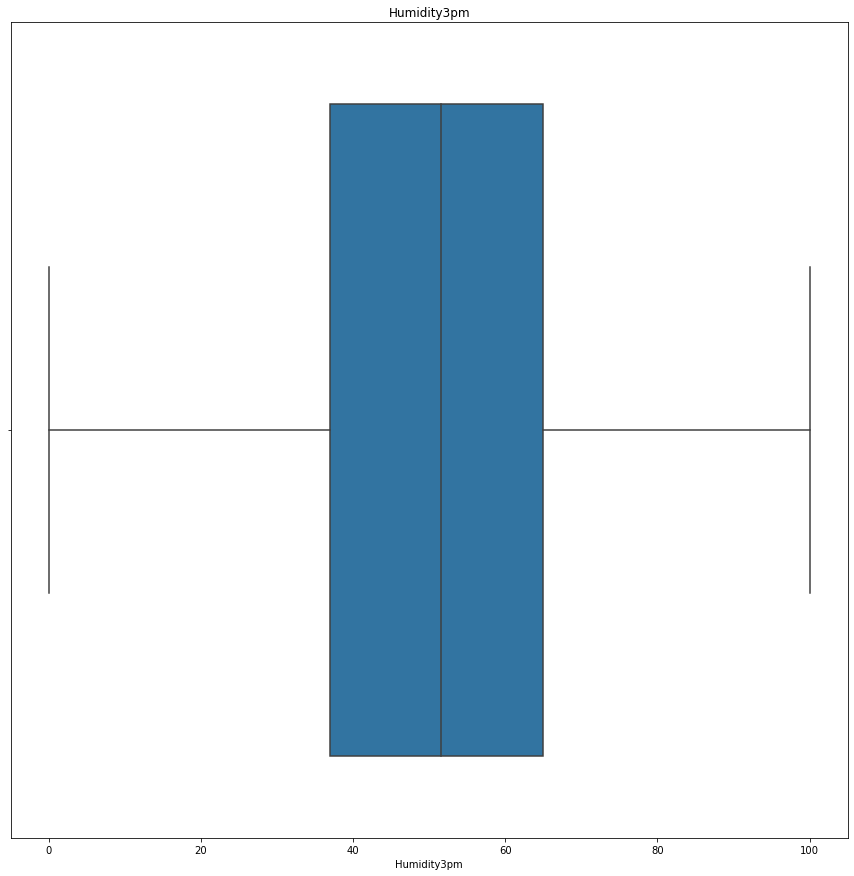

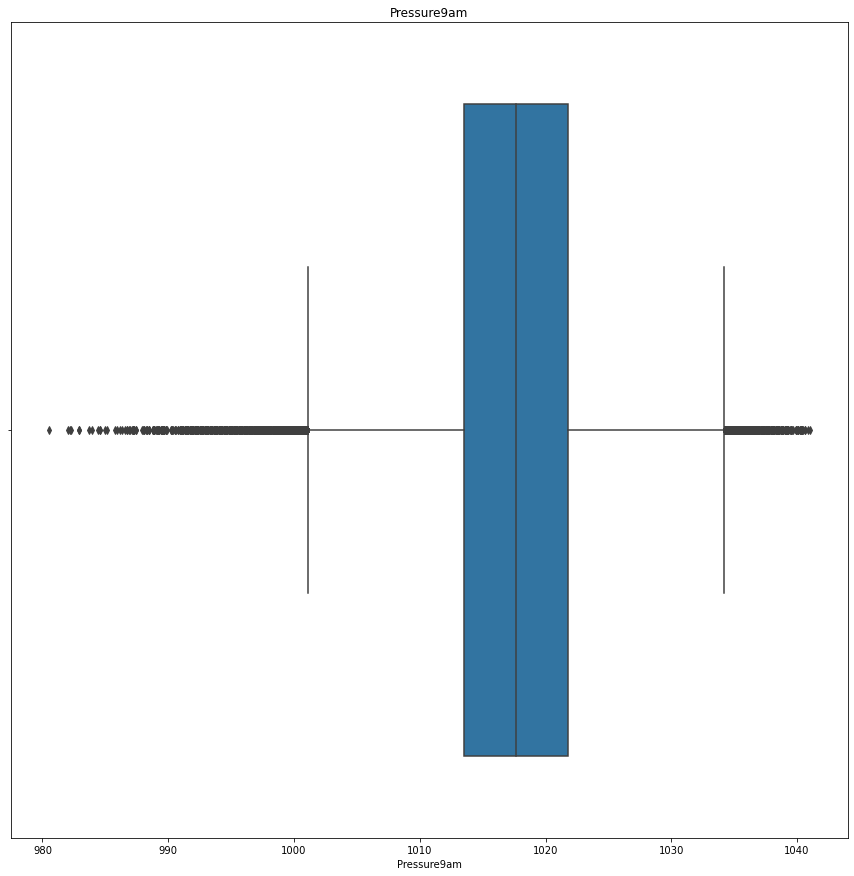

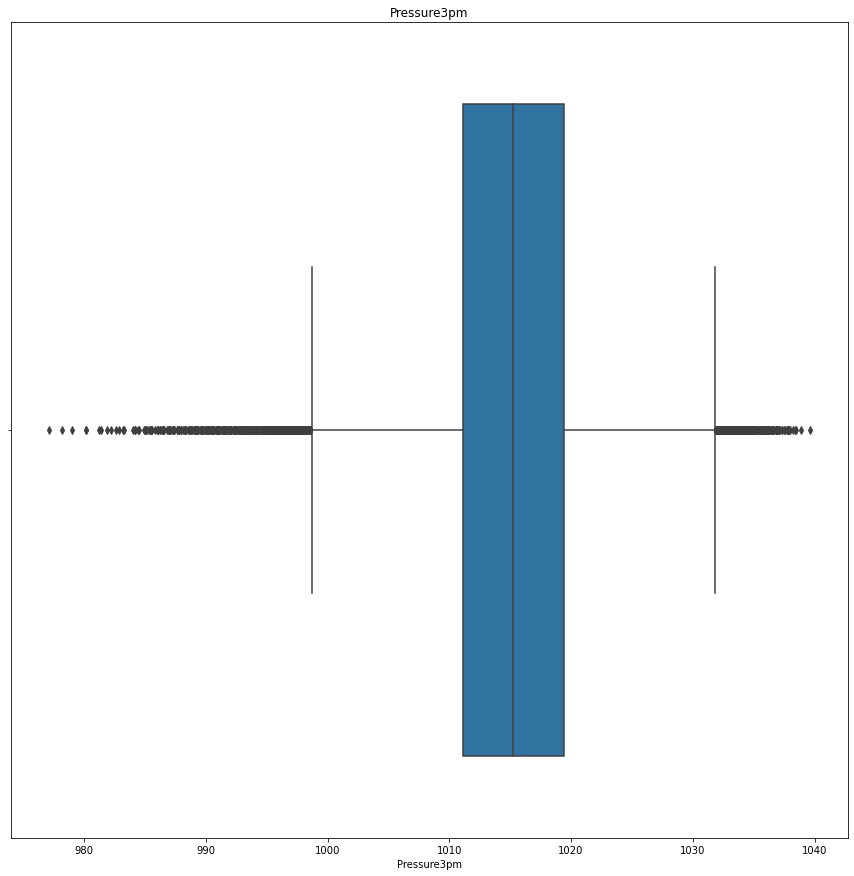

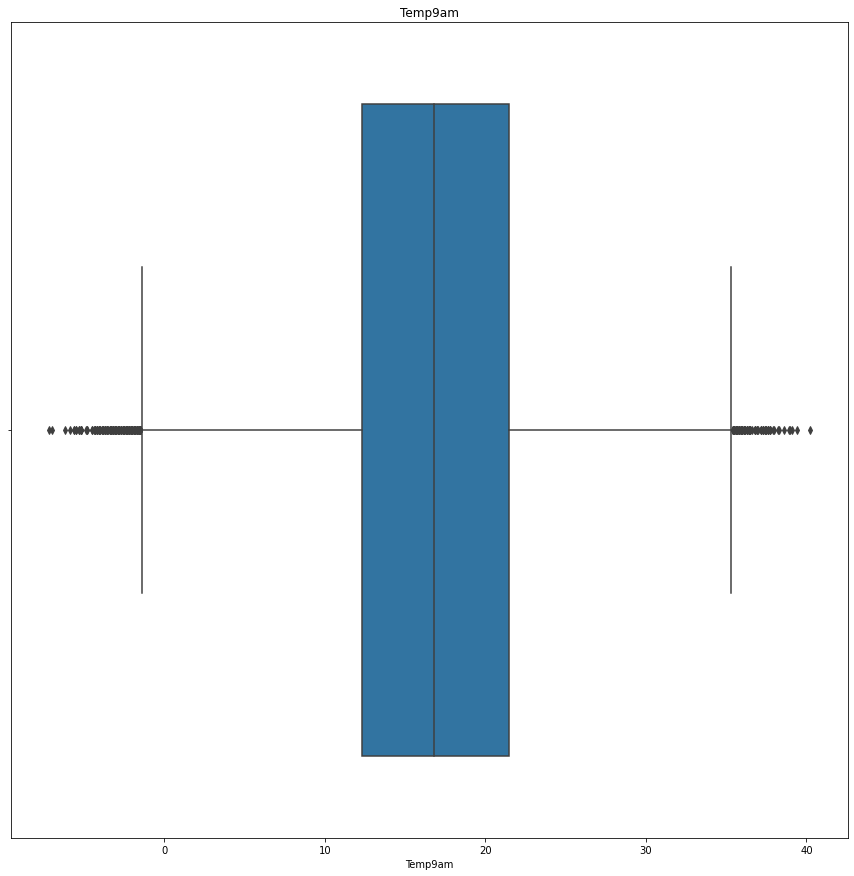

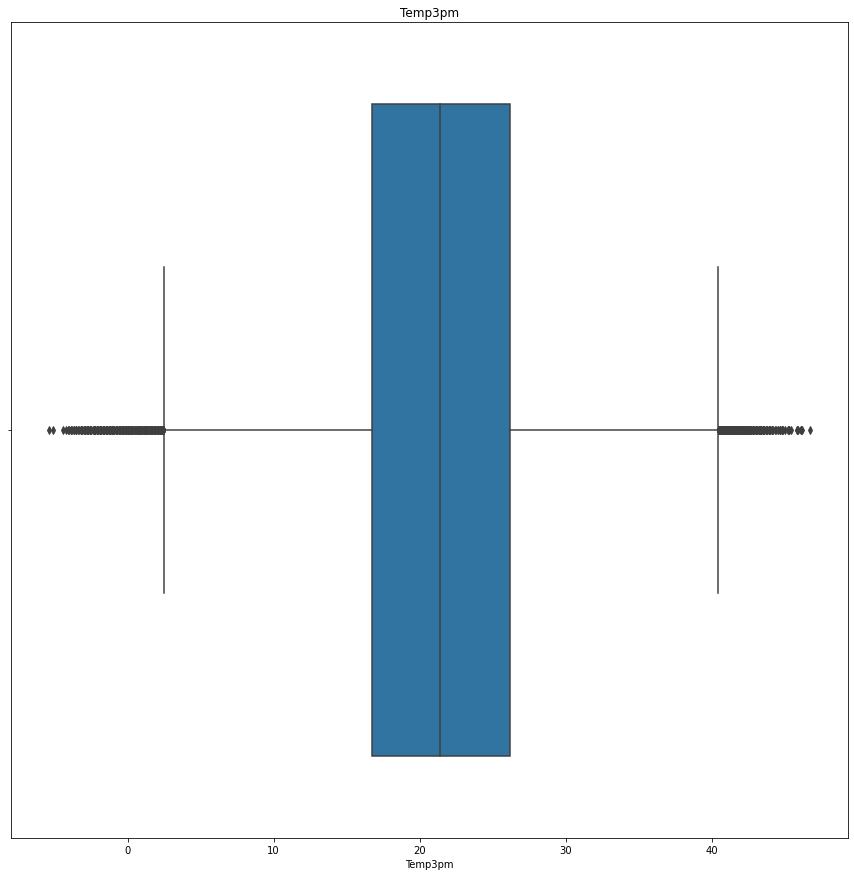

<Figure size 1080x1080 with 0 Axes>

In [33]:
for feature in continous:
    data=df.copy()
    sns.boxplot(data[feature])
    plt.title(feature)
    plt.figure(figsize=(15,15))
    

#### Outliers are not present in 
-> Humidity 3pm

### 1. MinTemp

In [34]:
IQR = df.MinTemp.quantile(0.75) - df.MinTemp.quantile(0.25)

upper_limit = df.MinTemp.quantile(0.75) + (1.5*IQR)

lower_limit = df.MinTemp.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 9.100000000000001
upper_limit : 30.450000000000003
lower_limt : -5.950000000000002


In [35]:
df = df[(df.MinTemp > lower_limit) & (df.MinTemp < upper_limit)]

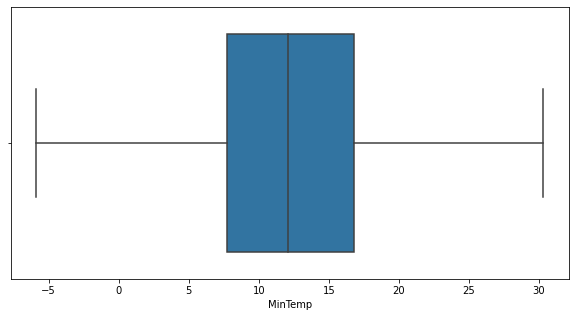

In [36]:
sns.boxplot(df.MinTemp)

### 2. MaxTemp

In [37]:
IQR = df.MaxTemp.quantile(0.75) - df.MaxTemp.quantile(0.25)

upper_limit = df.MaxTemp.quantile(0.75) + (1.5*IQR)

lower_limit = df.MaxTemp.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 10.2
upper_limit : 43.5
lower_limt : 2.700000000000001


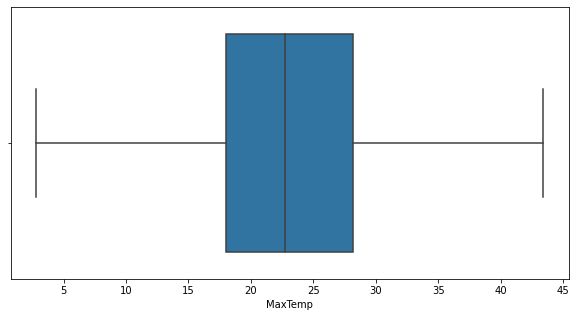

In [38]:
df = df[(df.MaxTemp > lower_limit) & (df.MaxTemp < upper_limit)]
sns.boxplot(df.MaxTemp)

### 3.Rainfall

In [39]:
IQR = df.Rainfall.quantile(0.75) - df.Rainfall.quantile(0.25)

upper_limit = df.Rainfall.quantile(0.75) + (1.5*IQR)

lower_limit = df.Rainfall.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 1.0
upper_limit : 2.5
lower_limt : -1.5


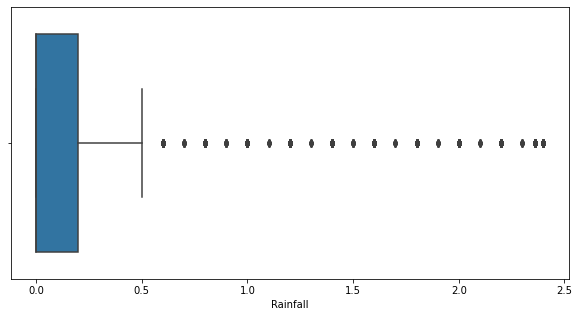

In [40]:
df = df[(df.Rainfall > lower_limit) & (df.Rainfall < upper_limit)]
sns.boxplot(df.Rainfall)

### 4.Evaporation

In [41]:
IQR = df.Evaporation.quantile(0.75) - df.Evaporation.quantile(0.25)

upper_limit = df.Evaporation.quantile(0.75) + (1.5*IQR)

lower_limit = df.Evaporation.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 1.1999999999999993
upper_limit : 7.399999999999999
lower_limt : 2.6000000000000014


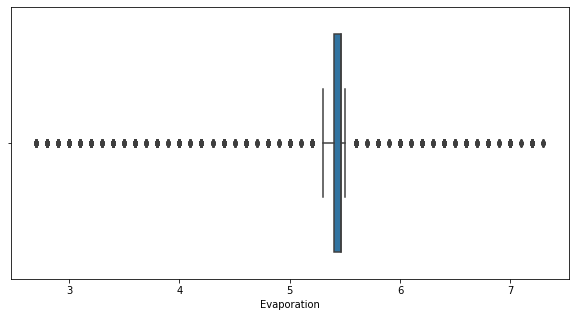

In [42]:
df = df[(df.Evaporation > lower_limit) & (df.Evaporation < upper_limit)]
sns.boxplot(df.Evaporation)

### 5.SUnshine

In [43]:
IQR = df.Sunshine.quantile(0.75) - df.Sunshine.quantile(0.25)

upper_limit = df.Sunshine.quantile(0.75) + (1.5*IQR)

lower_limit = df.Sunshine.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 0.18882247933885488
upper_limit : 8.083233719008282
lower_limt : 7.327943801652863


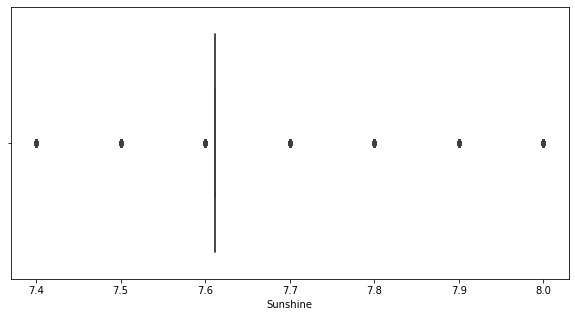

In [44]:
df = df[(df.Sunshine > lower_limit) & (df.Sunshine < upper_limit)]
sns.boxplot(df.Sunshine)

### 6.Windgustspeed

In [45]:
IQR = df.WindGustSpeed.quantile(0.75) - df.WindGustSpeed.quantile(0.25)

upper_limit = df.WindGustSpeed.quantile(0.75) + (1.5*IQR)

lower_limit = df.WindGustSpeed.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 14.0
upper_limit : 65.0
lower_limt : 9.0


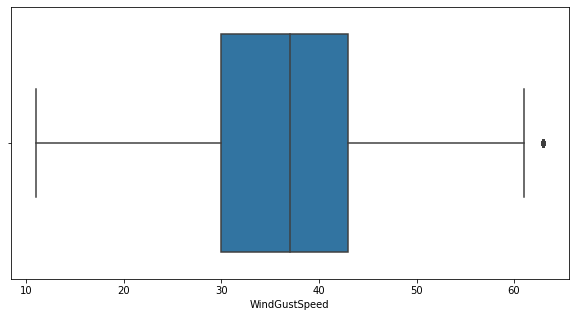

In [46]:
df = df[(df.WindGustSpeed > lower_limit) & (df.WindGustSpeed < upper_limit)]
sns.boxplot(df.WindGustSpeed)

### 7.Windspeed9am

In [47]:
IQR = df.WindSpeed9am.quantile(0.75) - df.WindSpeed9am.quantile(0.25)

upper_limit = df.WindSpeed9am.quantile(0.75) + (1.5*IQR)

lower_limit = df.WindSpeed9am.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 11.0
upper_limit : 33.5
lower_limt : -10.5


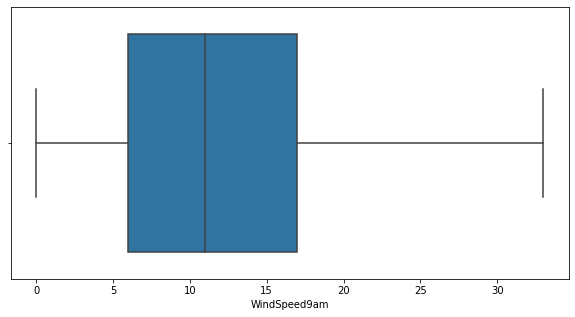

In [48]:
df = df[(df.WindSpeed9am > lower_limit) & (df.WindSpeed9am < upper_limit)]
sns.boxplot(df.WindSpeed9am)

### 8.Windspeed3pm

In [49]:
IQR = df.WindSpeed3pm.quantile(0.75) - df.WindSpeed3pm.quantile(0.25)

upper_limit = df.WindSpeed3pm.quantile(0.75) + (1.5*IQR)

lower_limit = df.WindSpeed3pm.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 11.0
upper_limit : 38.5
lower_limt : -5.5


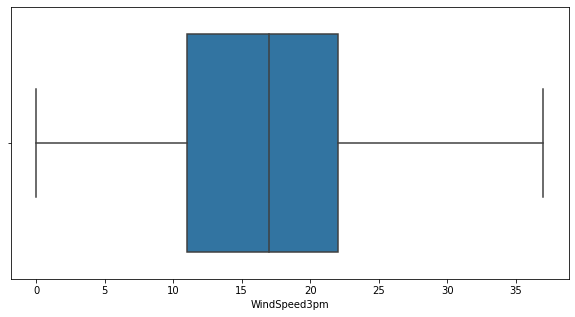

In [50]:
df = df[(df.WindSpeed3pm > lower_limit) & (df.WindSpeed3pm < upper_limit)]
sns.boxplot(df.WindSpeed3pm)

### 9.Humidity9am

In [51]:
IQR = df.Humidity9am.quantile(0.75) - df.Humidity9am.quantile(0.25)

upper_limit = df.Humidity9am.quantile(0.75) + (1.5*IQR)

lower_limit = df.Humidity9am.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 24.0
upper_limit : 118.0
lower_limt : 22.0


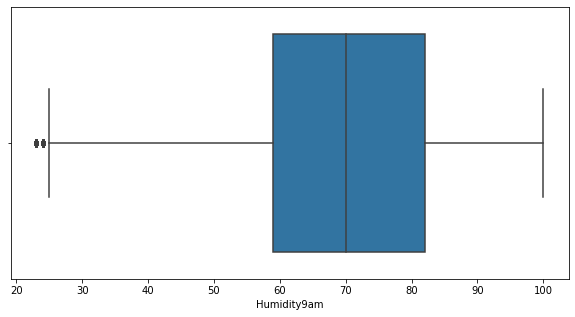

In [52]:
df = df[(df.Humidity9am > lower_limit) & (df.Humidity9am < upper_limit)]
sns.boxplot(df.Humidity9am)

### 10.Preasure9am

In [53]:
IQR = df.Pressure9am.quantile(0.75) - df.Pressure9am.quantile(0.25)

upper_limit = df.Pressure9am.quantile(0.75) + (1.5*IQR)

lower_limit = df.Pressure9am.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 6.2000000000000455
upper_limit : 1031.4
lower_limt : 1006.5999999999999


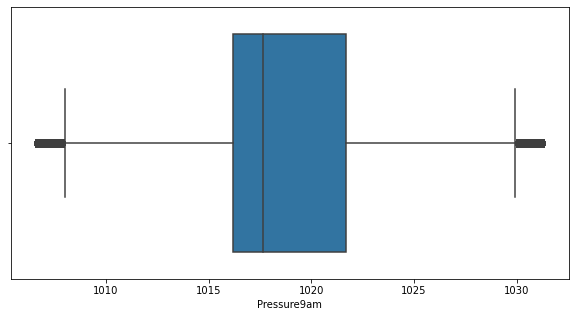

In [54]:
df = df[(df.Pressure9am > lower_limit) & (df.Pressure9am < upper_limit)]
sns.boxplot(df.Pressure9am)

### 11.Preasure3pm

In [55]:
IQR = df.Pressure3pm.quantile(0.75) - df.Pressure3pm.quantile(0.25)

upper_limit = df.Pressure3pm.quantile(0.75) + (1.5*IQR)

lower_limit = df.Pressure3pm.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 5.600000000000023
upper_limit : 1027.5
lower_limt : 1005.0999999999999


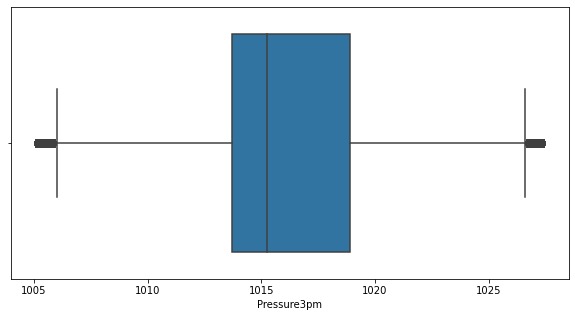

In [56]:
df = df[(df.Pressure3pm > lower_limit) & (df.Pressure3pm < upper_limit)]
sns.boxplot(df.Pressure3pm)

### 12.Temp9am

In [57]:
IQR = df.Temp9am.quantile(0.75) - df.Temp9am.quantile(0.25)

upper_limit = df.Temp9am.quantile(0.75) + (1.5*IQR)

lower_limit = df.Temp9am.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 8.099999999999998
upper_limit : 32.55
lower_limt : 0.1500000000000039


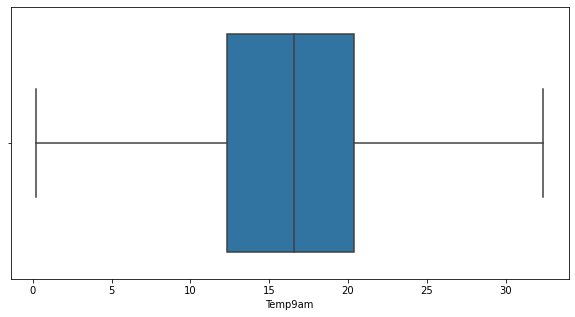

In [58]:
df = df[(df.Temp9am > lower_limit) & (df.Temp9am < upper_limit)]
sns.boxplot(df.Temp9am)

### 13.Temp3pm

In [59]:
IQR = df.Temp3pm.quantile(0.75) - df.Temp3pm.quantile(0.25)

upper_limit = df.Temp3pm.quantile(0.75) + (1.5*IQR)

lower_limit = df.Temp3pm.quantile(0.25) - (1.5*IQR)
print('IQR  :', IQR)
print('upper_limit :',upper_limit)
print('lower_limt :',lower_limit)

IQR  : 8.100000000000001
upper_limit : 37.650000000000006
lower_limt : 5.2499999999999964


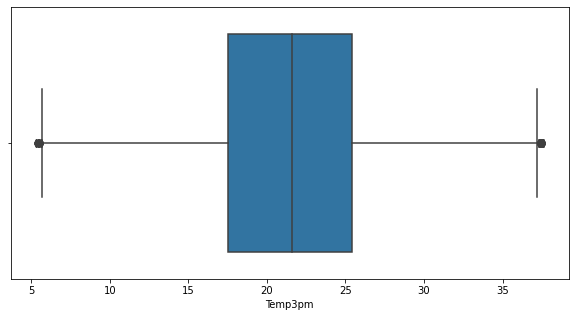

In [60]:
df = df[(df.Temp3pm > lower_limit) & (df.Temp3pm < upper_limit)]
sns.boxplot(df.Temp3pm)

# 7.Defining independent and dependent variable

In [61]:
x = df.iloc[:,:-1]
y = df.iloc[:,-1]

# 8. Standardisation

In [62]:
std = StandardScaler()
x = std.fit_transform(x)

# 9. Splitting the dataset

In [63]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

# 10.imbalanced dataset

In [64]:
df.RainTomorrow.value_counts()

0    38908
1     7035
Name: RainTomorrow, dtype: int64

In [65]:
sm = SMOTE()
x_train_sm,y_train_sm = sm.fit_resample(x_train,y_train)

In [66]:
x_train_sms,y_train_sms = sm.fit_resample(x_train,y_train)

In [67]:
y_train_sm.value_counts()

1    31082
0    31082
Name: RainTomorrow, dtype: int64

# 10.Modelselection

In [93]:
cat = CatBoostClassifier(iterations=2000, eval_metric = "AUC")
cat.fit(x_train_sm, y_train_sm)

Learning rate set to 0.031822
0:	total: 40ms	remaining: 1m 19s
1:	total: 73.6ms	remaining: 1m 13s
2:	total: 106ms	remaining: 1m 10s
3:	total: 139ms	remaining: 1m 9s
4:	total: 172ms	remaining: 1m 8s
5:	total: 194ms	remaining: 1m 4s
6:	total: 216ms	remaining: 1m 1s
7:	total: 243ms	remaining: 1m
8:	total: 270ms	remaining: 59.7s
9:	total: 298ms	remaining: 59.3s
10:	total: 331ms	remaining: 59.8s
11:	total: 363ms	remaining: 1m
12:	total: 391ms	remaining: 59.7s
13:	total: 421ms	remaining: 59.7s
14:	total: 446ms	remaining: 59.1s
15:	total: 474ms	remaining: 58.8s
16:	total: 503ms	remaining: 58.6s
17:	total: 535ms	remaining: 58.9s
18:	total: 563ms	remaining: 58.7s
19:	total: 595ms	remaining: 58.9s
20:	total: 628ms	remaining: 59.2s
21:	total: 651ms	remaining: 58.5s
22:	total: 684ms	remaining: 58.8s
23:	total: 712ms	remaining: 58.6s
24:	total: 742ms	remaining: 58.6s
25:	total: 768ms	remaining: 58.3s
26:	total: 790ms	remaining: 57.7s
27:	total: 818ms	remaining: 57.6s
28:	total: 842ms	remaining: 57.

244:	total: 6.9s	remaining: 49.4s
245:	total: 6.92s	remaining: 49.4s
246:	total: 6.96s	remaining: 49.4s
247:	total: 6.99s	remaining: 49.4s
248:	total: 7.02s	remaining: 49.4s
249:	total: 7.06s	remaining: 49.4s
250:	total: 7.09s	remaining: 49.4s
251:	total: 7.11s	remaining: 49.3s
252:	total: 7.14s	remaining: 49.3s
253:	total: 7.16s	remaining: 49.2s
254:	total: 7.19s	remaining: 49.2s
255:	total: 7.22s	remaining: 49.2s
256:	total: 7.25s	remaining: 49.1s
257:	total: 7.27s	remaining: 49.1s
258:	total: 7.3s	remaining: 49.1s
259:	total: 7.33s	remaining: 49.1s
260:	total: 7.36s	remaining: 49s
261:	total: 7.39s	remaining: 49s
262:	total: 7.42s	remaining: 49s
263:	total: 7.44s	remaining: 49s
264:	total: 7.47s	remaining: 48.9s
265:	total: 7.49s	remaining: 48.9s
266:	total: 7.52s	remaining: 48.8s
267:	total: 7.55s	remaining: 48.8s
268:	total: 7.58s	remaining: 48.8s
269:	total: 7.61s	remaining: 48.8s
270:	total: 7.64s	remaining: 48.8s
271:	total: 7.67s	remaining: 48.7s
272:	total: 7.69s	remaining: 4

483:	total: 13.9s	remaining: 43.7s
484:	total: 14s	remaining: 43.6s
485:	total: 14s	remaining: 43.6s
486:	total: 14s	remaining: 43.6s
487:	total: 14.1s	remaining: 43.6s
488:	total: 14.1s	remaining: 43.5s
489:	total: 14.1s	remaining: 43.5s
490:	total: 14.1s	remaining: 43.5s
491:	total: 14.2s	remaining: 43.5s
492:	total: 14.2s	remaining: 43.4s
493:	total: 14.2s	remaining: 43.4s
494:	total: 14.3s	remaining: 43.4s
495:	total: 14.3s	remaining: 43.4s
496:	total: 14.3s	remaining: 43.3s
497:	total: 14.4s	remaining: 43.3s
498:	total: 14.4s	remaining: 43.3s
499:	total: 14.4s	remaining: 43.3s
500:	total: 14.5s	remaining: 43.3s
501:	total: 14.5s	remaining: 43.2s
502:	total: 14.5s	remaining: 43.2s
503:	total: 14.5s	remaining: 43.2s
504:	total: 14.6s	remaining: 43.2s
505:	total: 14.6s	remaining: 43.1s
506:	total: 14.6s	remaining: 43.1s
507:	total: 14.7s	remaining: 43.1s
508:	total: 14.7s	remaining: 43.1s
509:	total: 14.7s	remaining: 43s
510:	total: 14.8s	remaining: 43s
511:	total: 14.8s	remaining: 4

724:	total: 21.1s	remaining: 37.1s
725:	total: 21.1s	remaining: 37.1s
726:	total: 21.2s	remaining: 37.1s
727:	total: 21.2s	remaining: 37.1s
728:	total: 21.2s	remaining: 37s
729:	total: 21.3s	remaining: 37s
730:	total: 21.3s	remaining: 37s
731:	total: 21.3s	remaining: 36.9s
732:	total: 21.4s	remaining: 36.9s
733:	total: 21.4s	remaining: 36.9s
734:	total: 21.4s	remaining: 36.9s
735:	total: 21.5s	remaining: 36.9s
736:	total: 21.5s	remaining: 36.8s
737:	total: 21.5s	remaining: 36.8s
738:	total: 21.5s	remaining: 36.8s
739:	total: 21.6s	remaining: 36.7s
740:	total: 21.6s	remaining: 36.7s
741:	total: 21.6s	remaining: 36.7s
742:	total: 21.7s	remaining: 36.7s
743:	total: 21.7s	remaining: 36.6s
744:	total: 21.7s	remaining: 36.6s
745:	total: 21.8s	remaining: 36.6s
746:	total: 21.8s	remaining: 36.6s
747:	total: 21.8s	remaining: 36.5s
748:	total: 21.9s	remaining: 36.5s
749:	total: 21.9s	remaining: 36.5s
750:	total: 21.9s	remaining: 36.4s
751:	total: 21.9s	remaining: 36.4s
752:	total: 22s	remaining:

966:	total: 28.5s	remaining: 30.4s
967:	total: 28.5s	remaining: 30.4s
968:	total: 28.6s	remaining: 30.4s
969:	total: 28.6s	remaining: 30.3s
970:	total: 28.6s	remaining: 30.3s
971:	total: 28.6s	remaining: 30.3s
972:	total: 28.7s	remaining: 30.3s
973:	total: 28.7s	remaining: 30.2s
974:	total: 28.7s	remaining: 30.2s
975:	total: 28.8s	remaining: 30.2s
976:	total: 28.8s	remaining: 30.2s
977:	total: 28.8s	remaining: 30.1s
978:	total: 28.9s	remaining: 30.1s
979:	total: 28.9s	remaining: 30.1s
980:	total: 28.9s	remaining: 30s
981:	total: 29s	remaining: 30s
982:	total: 29s	remaining: 30s
983:	total: 29s	remaining: 30s
984:	total: 29s	remaining: 29.9s
985:	total: 29.1s	remaining: 29.9s
986:	total: 29.1s	remaining: 29.9s
987:	total: 29.1s	remaining: 29.8s
988:	total: 29.2s	remaining: 29.8s
989:	total: 29.2s	remaining: 29.8s
990:	total: 29.2s	remaining: 29.8s
991:	total: 29.3s	remaining: 29.7s
992:	total: 29.3s	remaining: 29.7s
993:	total: 29.3s	remaining: 29.7s
994:	total: 29.3s	remaining: 29.6s
9

1198:	total: 35.5s	remaining: 23.7s
1199:	total: 35.5s	remaining: 23.7s
1200:	total: 35.6s	remaining: 23.7s
1201:	total: 35.6s	remaining: 23.6s
1202:	total: 35.6s	remaining: 23.6s
1203:	total: 35.7s	remaining: 23.6s
1204:	total: 35.7s	remaining: 23.6s
1205:	total: 35.7s	remaining: 23.5s
1206:	total: 35.8s	remaining: 23.5s
1207:	total: 35.8s	remaining: 23.5s
1208:	total: 35.8s	remaining: 23.4s
1209:	total: 35.9s	remaining: 23.4s
1210:	total: 35.9s	remaining: 23.4s
1211:	total: 35.9s	remaining: 23.4s
1212:	total: 36s	remaining: 23.3s
1213:	total: 36s	remaining: 23.3s
1214:	total: 36s	remaining: 23.3s
1215:	total: 36s	remaining: 23.2s
1216:	total: 36.1s	remaining: 23.2s
1217:	total: 36.1s	remaining: 23.2s
1218:	total: 36.1s	remaining: 23.2s
1219:	total: 36.2s	remaining: 23.1s
1220:	total: 36.2s	remaining: 23.1s
1221:	total: 36.2s	remaining: 23.1s
1222:	total: 36.3s	remaining: 23s
1223:	total: 36.3s	remaining: 23s
1224:	total: 36.3s	remaining: 23s
1225:	total: 36.4s	remaining: 22.9s
1226:	

1430:	total: 42.5s	remaining: 16.9s
1431:	total: 42.5s	remaining: 16.9s
1432:	total: 42.5s	remaining: 16.8s
1433:	total: 42.6s	remaining: 16.8s
1434:	total: 42.6s	remaining: 16.8s
1435:	total: 42.6s	remaining: 16.8s
1436:	total: 42.7s	remaining: 16.7s
1437:	total: 42.7s	remaining: 16.7s
1438:	total: 42.8s	remaining: 16.7s
1439:	total: 42.8s	remaining: 16.6s
1440:	total: 42.8s	remaining: 16.6s
1441:	total: 42.8s	remaining: 16.6s
1442:	total: 42.9s	remaining: 16.6s
1443:	total: 42.9s	remaining: 16.5s
1444:	total: 43s	remaining: 16.5s
1445:	total: 43s	remaining: 16.5s
1446:	total: 43s	remaining: 16.4s
1447:	total: 43s	remaining: 16.4s
1448:	total: 43.1s	remaining: 16.4s
1449:	total: 43.1s	remaining: 16.4s
1450:	total: 43.2s	remaining: 16.3s
1451:	total: 43.2s	remaining: 16.3s
1452:	total: 43.2s	remaining: 16.3s
1453:	total: 43.3s	remaining: 16.2s
1454:	total: 43.3s	remaining: 16.2s
1455:	total: 43.3s	remaining: 16.2s
1456:	total: 43.4s	remaining: 16.2s
1457:	total: 43.4s	remaining: 16.1s


1664:	total: 50.2s	remaining: 10.1s
1665:	total: 50.2s	remaining: 10.1s
1666:	total: 50.3s	remaining: 10s
1667:	total: 50.3s	remaining: 10s
1668:	total: 50.3s	remaining: 9.98s
1669:	total: 50.4s	remaining: 9.95s
1670:	total: 50.4s	remaining: 9.92s
1671:	total: 50.4s	remaining: 9.89s
1672:	total: 50.5s	remaining: 9.86s
1673:	total: 50.5s	remaining: 9.83s
1674:	total: 50.5s	remaining: 9.8s
1675:	total: 50.6s	remaining: 9.77s
1676:	total: 50.6s	remaining: 9.74s
1677:	total: 50.6s	remaining: 9.71s
1678:	total: 50.6s	remaining: 9.68s
1679:	total: 50.7s	remaining: 9.65s
1680:	total: 50.7s	remaining: 9.62s
1681:	total: 50.7s	remaining: 9.59s
1682:	total: 50.8s	remaining: 9.56s
1683:	total: 50.8s	remaining: 9.53s
1684:	total: 50.8s	remaining: 9.5s
1685:	total: 50.9s	remaining: 9.47s
1686:	total: 50.9s	remaining: 9.44s
1687:	total: 50.9s	remaining: 9.41s
1688:	total: 51s	remaining: 9.38s
1689:	total: 51s	remaining: 9.35s
1690:	total: 51s	remaining: 9.32s
1691:	total: 51s	remaining: 9.29s
1692:	

1894:	total: 57.1s	remaining: 3.17s
1895:	total: 57.2s	remaining: 3.13s
1896:	total: 57.2s	remaining: 3.1s
1897:	total: 57.2s	remaining: 3.08s
1898:	total: 57.2s	remaining: 3.04s
1899:	total: 57.3s	remaining: 3.01s
1900:	total: 57.3s	remaining: 2.98s
1901:	total: 57.3s	remaining: 2.95s
1902:	total: 57.3s	remaining: 2.92s
1903:	total: 57.4s	remaining: 2.89s
1904:	total: 57.4s	remaining: 2.86s
1905:	total: 57.4s	remaining: 2.83s
1906:	total: 57.4s	remaining: 2.8s
1907:	total: 57.5s	remaining: 2.77s
1908:	total: 57.5s	remaining: 2.74s
1909:	total: 57.5s	remaining: 2.71s
1910:	total: 57.5s	remaining: 2.68s
1911:	total: 57.6s	remaining: 2.65s
1912:	total: 57.6s	remaining: 2.62s
1913:	total: 57.6s	remaining: 2.59s
1914:	total: 57.6s	remaining: 2.56s
1915:	total: 57.7s	remaining: 2.53s
1916:	total: 57.7s	remaining: 2.5s
1917:	total: 57.7s	remaining: 2.47s
1918:	total: 57.8s	remaining: 2.44s
1919:	total: 57.8s	remaining: 2.41s
1920:	total: 57.8s	remaining: 2.38s
1921:	total: 57.8s	remaining: 2

In [94]:
y_pred = cat.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))


[[7575  251]
 [ 871  492]]
0.8778974861247143
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      7826
           1       0.66      0.36      0.47      1363

    accuracy                           0.88      9189
   macro avg       0.78      0.66      0.70      9189
weighted avg       0.86      0.88      0.86      9189



0.664447936680017

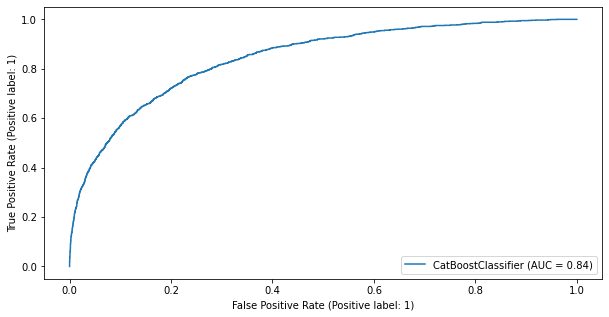

In [95]:
metrics.plot_roc_curve(cat, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [96]:
# after standardising
cat = CatBoostClassifier(iterations=2000, eval_metric = "AUC")
cat.fit(x_train_sms, y_train_sms)

Learning rate set to 0.031822
0:	total: 38.6ms	remaining: 1m 17s
1:	total: 71.4ms	remaining: 1m 11s
2:	total: 104ms	remaining: 1m 9s
3:	total: 140ms	remaining: 1m 9s
4:	total: 173ms	remaining: 1m 9s
5:	total: 201ms	remaining: 1m 6s
6:	total: 225ms	remaining: 1m 4s
7:	total: 254ms	remaining: 1m 3s
8:	total: 290ms	remaining: 1m 4s
9:	total: 325ms	remaining: 1m 4s
10:	total: 357ms	remaining: 1m 4s
11:	total: 384ms	remaining: 1m 3s
12:	total: 405ms	remaining: 1m 1s
13:	total: 438ms	remaining: 1m 2s
14:	total: 468ms	remaining: 1m 1s
15:	total: 499ms	remaining: 1m 1s
16:	total: 531ms	remaining: 1m 1s
17:	total: 554ms	remaining: 1m 1s
18:	total: 574ms	remaining: 59.8s
19:	total: 605ms	remaining: 59.9s
20:	total: 638ms	remaining: 1m
21:	total: 670ms	remaining: 1m
22:	total: 701ms	remaining: 1m
23:	total: 731ms	remaining: 1m
24:	total: 752ms	remaining: 59.4s
25:	total: 778ms	remaining: 59.1s
26:	total: 809ms	remaining: 59.1s
27:	total: 842ms	remaining: 59.3s
28:	total: 874ms	remaining: 59.4s
29

243:	total: 7.25s	remaining: 52.2s
244:	total: 7.28s	remaining: 52.2s
245:	total: 7.31s	remaining: 52.2s
246:	total: 7.35s	remaining: 52.1s
247:	total: 7.38s	remaining: 52.1s
248:	total: 7.41s	remaining: 52.1s
249:	total: 7.44s	remaining: 52.1s
250:	total: 7.47s	remaining: 52.1s
251:	total: 7.5s	remaining: 52.1s
252:	total: 7.54s	remaining: 52.1s
253:	total: 7.57s	remaining: 52.1s
254:	total: 7.61s	remaining: 52.1s
255:	total: 7.63s	remaining: 52s
256:	total: 7.66s	remaining: 52s
257:	total: 7.69s	remaining: 51.9s
258:	total: 7.72s	remaining: 51.9s
259:	total: 7.76s	remaining: 51.9s
260:	total: 7.79s	remaining: 51.9s
261:	total: 7.82s	remaining: 51.8s
262:	total: 7.85s	remaining: 51.8s
263:	total: 7.88s	remaining: 51.8s
264:	total: 7.91s	remaining: 51.8s
265:	total: 7.94s	remaining: 51.8s
266:	total: 7.97s	remaining: 51.8s
267:	total: 8s	remaining: 51.7s
268:	total: 8.03s	remaining: 51.7s
269:	total: 8.06s	remaining: 51.6s
270:	total: 8.09s	remaining: 51.6s
271:	total: 8.12s	remaining:

481:	total: 14.3s	remaining: 45s
482:	total: 14.3s	remaining: 44.9s
483:	total: 14.3s	remaining: 44.9s
484:	total: 14.4s	remaining: 44.9s
485:	total: 14.4s	remaining: 44.9s
486:	total: 14.4s	remaining: 44.8s
487:	total: 14.5s	remaining: 44.8s
488:	total: 14.5s	remaining: 44.8s
489:	total: 14.5s	remaining: 44.8s
490:	total: 14.6s	remaining: 44.7s
491:	total: 14.6s	remaining: 44.7s
492:	total: 14.6s	remaining: 44.7s
493:	total: 14.7s	remaining: 44.7s
494:	total: 14.7s	remaining: 44.6s
495:	total: 14.7s	remaining: 44.6s
496:	total: 14.7s	remaining: 44.6s
497:	total: 14.8s	remaining: 44.6s
498:	total: 14.8s	remaining: 44.5s
499:	total: 14.8s	remaining: 44.5s
500:	total: 14.9s	remaining: 44.5s
501:	total: 14.9s	remaining: 44.5s
502:	total: 14.9s	remaining: 44.4s
503:	total: 15s	remaining: 44.4s
504:	total: 15s	remaining: 44.4s
505:	total: 15s	remaining: 44.4s
506:	total: 15s	remaining: 44.3s
507:	total: 15.1s	remaining: 44.3s
508:	total: 15.1s	remaining: 44.3s
509:	total: 15.1s	remaining: 4

720:	total: 21.4s	remaining: 38s
721:	total: 21.4s	remaining: 37.9s
722:	total: 21.4s	remaining: 37.9s
723:	total: 21.5s	remaining: 37.9s
724:	total: 21.5s	remaining: 37.8s
725:	total: 21.5s	remaining: 37.8s
726:	total: 21.6s	remaining: 37.8s
727:	total: 21.6s	remaining: 37.7s
728:	total: 21.6s	remaining: 37.7s
729:	total: 21.7s	remaining: 37.7s
730:	total: 21.7s	remaining: 37.6s
731:	total: 21.7s	remaining: 37.6s
732:	total: 21.7s	remaining: 37.6s
733:	total: 21.8s	remaining: 37.5s
734:	total: 21.8s	remaining: 37.5s
735:	total: 21.8s	remaining: 37.5s
736:	total: 21.8s	remaining: 37.4s
737:	total: 21.9s	remaining: 37.4s
738:	total: 21.9s	remaining: 37.4s
739:	total: 21.9s	remaining: 37.4s
740:	total: 22s	remaining: 37.3s
741:	total: 22s	remaining: 37.3s
742:	total: 22s	remaining: 37.3s
743:	total: 22.1s	remaining: 37.2s
744:	total: 22.1s	remaining: 37.2s
745:	total: 22.1s	remaining: 37.2s
746:	total: 22.1s	remaining: 37.1s
747:	total: 22.2s	remaining: 37.1s
748:	total: 22.2s	remaining:

957:	total: 28.3s	remaining: 30.8s
958:	total: 28.3s	remaining: 30.8s
959:	total: 28.4s	remaining: 30.7s
960:	total: 28.4s	remaining: 30.7s
961:	total: 28.4s	remaining: 30.7s
962:	total: 28.5s	remaining: 30.6s
963:	total: 28.5s	remaining: 30.6s
964:	total: 28.5s	remaining: 30.6s
965:	total: 28.5s	remaining: 30.6s
966:	total: 28.6s	remaining: 30.5s
967:	total: 28.6s	remaining: 30.5s
968:	total: 28.6s	remaining: 30.5s
969:	total: 28.7s	remaining: 30.4s
970:	total: 28.7s	remaining: 30.4s
971:	total: 28.7s	remaining: 30.4s
972:	total: 28.8s	remaining: 30.4s
973:	total: 28.8s	remaining: 30.3s
974:	total: 28.8s	remaining: 30.3s
975:	total: 28.8s	remaining: 30.3s
976:	total: 28.9s	remaining: 30.2s
977:	total: 28.9s	remaining: 30.2s
978:	total: 28.9s	remaining: 30.2s
979:	total: 28.9s	remaining: 30.1s
980:	total: 29s	remaining: 30.1s
981:	total: 29s	remaining: 30.1s
982:	total: 29s	remaining: 30s
983:	total: 29.1s	remaining: 30s
984:	total: 29.1s	remaining: 30s
985:	total: 29.1s	remaining: 29.

1191:	total: 35.3s	remaining: 23.9s
1192:	total: 35.3s	remaining: 23.9s
1193:	total: 35.3s	remaining: 23.8s
1194:	total: 35.4s	remaining: 23.8s
1195:	total: 35.4s	remaining: 23.8s
1196:	total: 35.4s	remaining: 23.8s
1197:	total: 35.4s	remaining: 23.7s
1198:	total: 35.5s	remaining: 23.7s
1199:	total: 35.5s	remaining: 23.7s
1200:	total: 35.5s	remaining: 23.6s
1201:	total: 35.6s	remaining: 23.6s
1202:	total: 35.6s	remaining: 23.6s
1203:	total: 35.6s	remaining: 23.6s
1204:	total: 35.7s	remaining: 23.5s
1205:	total: 35.7s	remaining: 23.5s
1206:	total: 35.7s	remaining: 23.5s
1207:	total: 35.7s	remaining: 23.4s
1208:	total: 35.8s	remaining: 23.4s
1209:	total: 35.8s	remaining: 23.4s
1210:	total: 35.8s	remaining: 23.4s
1211:	total: 35.9s	remaining: 23.3s
1212:	total: 35.9s	remaining: 23.3s
1213:	total: 35.9s	remaining: 23.3s
1214:	total: 36s	remaining: 23.2s
1215:	total: 36s	remaining: 23.2s
1216:	total: 36s	remaining: 23.2s
1217:	total: 36.1s	remaining: 23.2s
1218:	total: 36.1s	remaining: 23.1

1422:	total: 42.2s	remaining: 17.1s
1423:	total: 42.2s	remaining: 17.1s
1424:	total: 42.2s	remaining: 17s
1425:	total: 42.2s	remaining: 17s
1426:	total: 42.3s	remaining: 17s
1427:	total: 42.3s	remaining: 16.9s
1428:	total: 42.3s	remaining: 16.9s
1429:	total: 42.4s	remaining: 16.9s
1430:	total: 42.4s	remaining: 16.9s
1431:	total: 42.4s	remaining: 16.8s
1432:	total: 42.5s	remaining: 16.8s
1433:	total: 42.5s	remaining: 16.8s
1434:	total: 42.5s	remaining: 16.7s
1435:	total: 42.5s	remaining: 16.7s
1436:	total: 42.6s	remaining: 16.7s
1437:	total: 42.6s	remaining: 16.6s
1438:	total: 42.6s	remaining: 16.6s
1439:	total: 42.7s	remaining: 16.6s
1440:	total: 42.7s	remaining: 16.6s
1441:	total: 42.7s	remaining: 16.5s
1442:	total: 42.8s	remaining: 16.5s
1443:	total: 42.8s	remaining: 16.5s
1444:	total: 42.8s	remaining: 16.4s
1445:	total: 42.8s	remaining: 16.4s
1446:	total: 42.9s	remaining: 16.4s
1447:	total: 42.9s	remaining: 16.4s
1448:	total: 42.9s	remaining: 16.3s
1449:	total: 43s	remaining: 16.3s


1653:	total: 49.1s	remaining: 10.3s
1654:	total: 49.1s	remaining: 10.2s
1655:	total: 49.2s	remaining: 10.2s
1656:	total: 49.2s	remaining: 10.2s
1657:	total: 49.2s	remaining: 10.2s
1658:	total: 49.3s	remaining: 10.1s
1659:	total: 49.3s	remaining: 10.1s
1660:	total: 49.3s	remaining: 10.1s
1661:	total: 49.4s	remaining: 10s
1662:	total: 49.4s	remaining: 10s
1663:	total: 49.4s	remaining: 9.98s
1664:	total: 49.5s	remaining: 9.95s
1665:	total: 49.5s	remaining: 9.92s
1666:	total: 49.5s	remaining: 9.89s
1667:	total: 49.5s	remaining: 9.86s
1668:	total: 49.6s	remaining: 9.83s
1669:	total: 49.6s	remaining: 9.8s
1670:	total: 49.6s	remaining: 9.77s
1671:	total: 49.7s	remaining: 9.74s
1672:	total: 49.7s	remaining: 9.71s
1673:	total: 49.7s	remaining: 9.68s
1674:	total: 49.8s	remaining: 9.65s
1675:	total: 49.8s	remaining: 9.63s
1676:	total: 49.8s	remaining: 9.6s
1677:	total: 49.9s	remaining: 9.57s
1678:	total: 49.9s	remaining: 9.54s
1679:	total: 49.9s	remaining: 9.51s
1680:	total: 49.9s	remaining: 9.48

1884:	total: 56s	remaining: 3.42s
1885:	total: 56s	remaining: 3.38s
1886:	total: 56s	remaining: 3.36s
1887:	total: 56.1s	remaining: 3.33s
1888:	total: 56.1s	remaining: 3.3s
1889:	total: 56.1s	remaining: 3.27s
1890:	total: 56.2s	remaining: 3.24s
1891:	total: 56.2s	remaining: 3.21s
1892:	total: 56.2s	remaining: 3.18s
1893:	total: 56.3s	remaining: 3.15s
1894:	total: 56.3s	remaining: 3.12s
1895:	total: 56.3s	remaining: 3.09s
1896:	total: 56.4s	remaining: 3.06s
1897:	total: 56.4s	remaining: 3.03s
1898:	total: 56.4s	remaining: 3s
1899:	total: 56.4s	remaining: 2.97s
1900:	total: 56.5s	remaining: 2.94s
1901:	total: 56.5s	remaining: 2.91s
1902:	total: 56.5s	remaining: 2.88s
1903:	total: 56.6s	remaining: 2.85s
1904:	total: 56.6s	remaining: 2.82s
1905:	total: 56.6s	remaining: 2.79s
1906:	total: 56.7s	remaining: 2.76s
1907:	total: 56.7s	remaining: 2.73s
1908:	total: 56.7s	remaining: 2.7s
1909:	total: 56.7s	remaining: 2.67s
1910:	total: 56.8s	remaining: 2.64s
1911:	total: 56.8s	remaining: 2.61s
191

In [97]:
y_pred = cat.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[7581  245]
 [ 884  479]]
0.8771357057351181
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      7826
           1       0.66      0.35      0.46      1363

    accuracy                           0.88      9189
   macro avg       0.78      0.66      0.69      9189
weighted avg       0.86      0.88      0.86      9189



0.6600623821229871

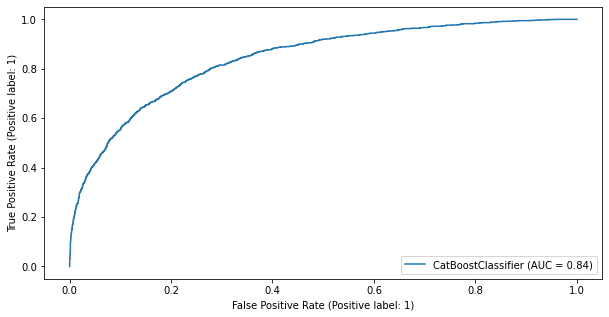

In [98]:
metrics.plot_roc_curve(cat, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [99]:
from sklearn.svm import SVC
log = LogisticRegression()
dec = DecisionTreeClassifier()
xg = XGBClassifier()
rand = RandomForestClassifier()
svc =SVC()
model = [log,dec,xg,rand,svc]



## 1.Logistic regression

In [100]:
log.fit(x_train_sm,y_train_sm)
y_pred = log.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[5850 1976]
 [ 372  991]]
0.7444770921754271
              precision    recall  f1-score   support

           0       0.94      0.75      0.83      7826
           1       0.33      0.73      0.46      1363

    accuracy                           0.74      9189
   macro avg       0.64      0.74      0.65      9189
weighted avg       0.85      0.74      0.78      9189



0.7372904697718292

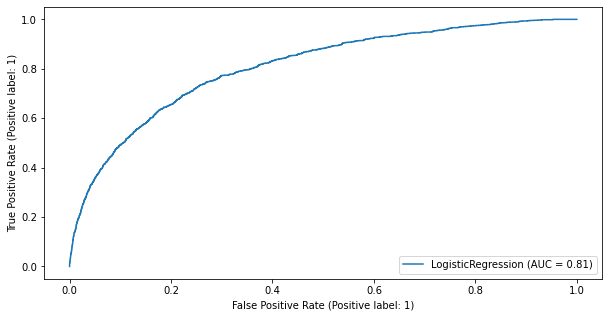

In [101]:
metrics.plot_roc_curve(log, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [102]:
# standardisation
log.fit(x_train_sms,y_train_sms)
y_pred = log.predict(x_test)
y_pred = log.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[5872 1954]
 [ 376  987]]
0.746435956034389
              precision    recall  f1-score   support

           0       0.94      0.75      0.83      7826
           1       0.34      0.72      0.46      1363

    accuracy                           0.75      9189
   macro avg       0.64      0.74      0.65      9189
weighted avg       0.85      0.75      0.78      9189



0.7372286895141746

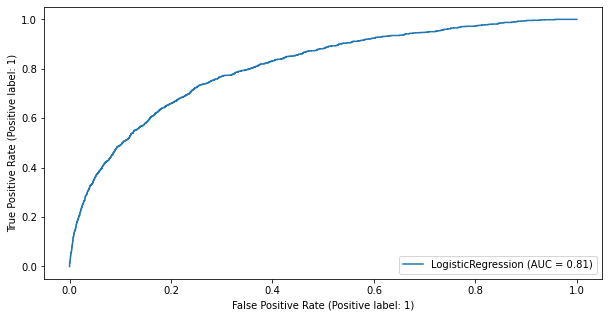

In [103]:
metrics.plot_roc_curve(log, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

## 2.Decisiontree

In [104]:
dec.fit(x_train_sm,y_train_sm)
y_pred = dec.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[6573 1253]
 [ 789  574]]
0.7777777777777778
              precision    recall  f1-score   support

           0       0.89      0.84      0.87      7826
           1       0.31      0.42      0.36      1363

    accuracy                           0.78      9189
   macro avg       0.60      0.63      0.61      9189
weighted avg       0.81      0.78      0.79      9189



0.6305112630378374

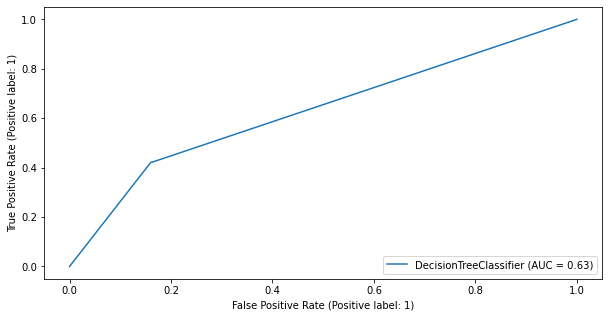

In [105]:
metrics.plot_roc_curve(dec, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [106]:
# standardisation
dec.fit(x_train_sms,y_train_sms)
y_pred = dec.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[6579 1247]
 [ 801  562]]
0.7771248231581238
              precision    recall  f1-score   support

           0       0.89      0.84      0.87      7826
           1       0.31      0.41      0.35      1363

    accuracy                           0.78      9189
   macro avg       0.60      0.63      0.61      9189
weighted avg       0.81      0.78      0.79      9189



0.6264925463384744

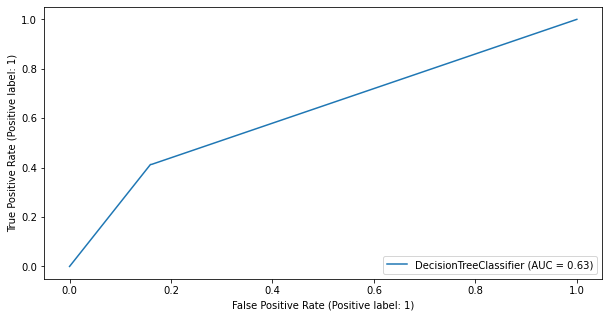

In [107]:
metrics.plot_roc_curve(dec, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

## 3.xgboost

In [108]:
xg.fit(x_train_sm,y_train_sm)
y_pred = xg.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:18] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[7504  322]
 [ 862  501]]
0.8711502883882903
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      7826
           1       0.61      0.37      0.46      1363

    accuracy                           0.87      9189
   macro avg       0.75      0.66      0.69      9189
weighted avg       0.85      0.87      0.86      9189



0.6632133158861135

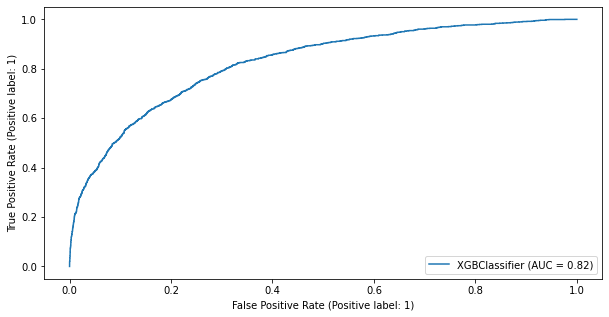

In [109]:
metrics.plot_roc_curve(xg, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [110]:
# standardisation
xg.fit(x_train_sms,y_train_sms)
y_pred = xg.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:26] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[7522  304]
 [ 890  473]]
0.8700620306888671
              precision    recall  f1-score   support

           0       0.89      0.96      0.93      7826
           1       0.61      0.35      0.44      1363

    accuracy                           0.87      9189
   macro avg       0.75      0.65      0.68      9189
weighted avg       0.85      0.87      0.85      9189



0.6540918686493598

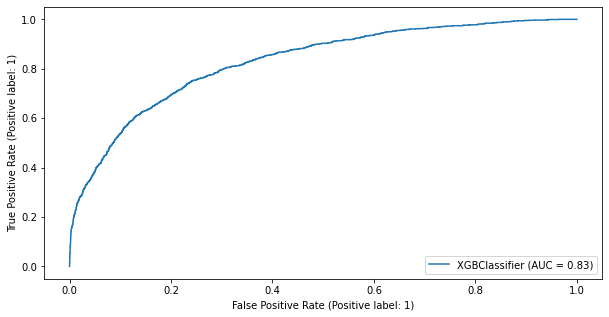

In [111]:
metrics.plot_roc_curve(xg, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [112]:
scores = cross_val_score(xg,x,y,cv=8)
print('MEAN : ',scores.mean())
print('STD : ', scores.std())

C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:34] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:36] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:39] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:41] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:44] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:46] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:49] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Hp\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:03:52] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
MEAN :  0.8614588683765854
STD :  0.01562772081181665


## 4.Rnadomforest

In [113]:
rand.fit(x_train_sm,y_train_sm)
y_pred = rand.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[7346  480]
 [ 782  581]]
0.8626618783327892
              precision    recall  f1-score   support

           0       0.90      0.94      0.92      7826
           1       0.55      0.43      0.48      1363

    accuracy                           0.86      9189
   macro avg       0.73      0.68      0.70      9189
weighted avg       0.85      0.86      0.86      9189



0.682465787893282

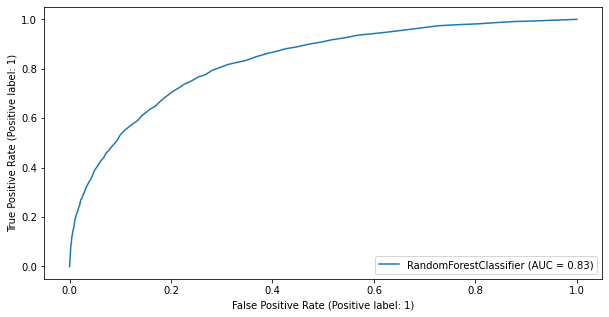

In [114]:
metrics.plot_roc_curve(rand, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [115]:
# standardisation
rand.fit(x_train_sms,y_train_sms)
y_pred = rand.predict(x_test)

print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[7325  501]
 [ 781  582]]
0.8604853629339427
              precision    recall  f1-score   support

           0       0.90      0.94      0.92      7826
           1       0.54      0.43      0.48      1363

    accuracy                           0.86      9189
   macro avg       0.72      0.68      0.70      9189
weighted avg       0.85      0.86      0.85      9189



0.6814909441767092

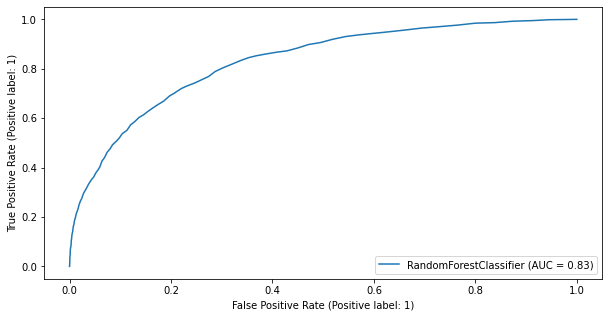

In [116]:
metrics.plot_roc_curve(rand, x_test, y_test)
metrics.roc_auc_score(y_test, y_pred, average=None) 

In [117]:
scores = cross_val_score(rand,x,y,cv=8)
print('MEAN : ',scores.mean())
print('STD : ', scores.std())

MEAN :  0.8672922575075571
STD :  0.006689424796640723
